In [48]:
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from hyperopt import fmin, tpe, hp, Trials, space_eval
from sklearn.metrics import mean_squared_error
from util import evaluate, plot_importance, plot_history
from sklearn.model_selection import train_test_split#安装库运行环境先百度清华镜像，清华镜像下载速度较快

In [49]:
data = pd.read_csv(r"G:\数据准备\12个城市外国PM2.5-网格形式\7个超大城市范围\北京市分区csv\北京市2_matched.csv")

In [50]:
cols = ['TCC_midu', 'subway_coverage_area', 'floor_area_ratio', 'population_density', 'beijing_LD_midu', 'road_density', 'poi_hhd2',  'bus_coverage_area',  'building_density', 'beijing_JZ_midu', 'beijing_JT_midu']#选择的自变量
X = data[cols]
y = data['value']

In [51]:
X

,TCC_midu,subway_coverage_area,floor_area_ratio,population_density,beijing_LD_midu,road_density,poi_hhd2,bus_coverage_area,building_density,beijing_JZ_midu,beijing_JT_midu
0,71.295121,0.000000,0.000000,0.090057,0.0,2.043905,0.000000e+00,0.194089,0.000000,0.000000,0.000000
1,62.623686,0.000000,0.000000,0.232602,0.0,2.391618,0.000000e+00,0.298038,0.000000,0.000000,0.000000
2,51.137958,0.234843,0.000000,0.664793,0.0,13.889157,-1.000000e-10,0.229936,0.000000,0.000000,11.363991
3,84.602695,0.000000,1.432934,3.213845,0.0,3.657037,8.163774e-01,1.315053,0.171808,8.460270,2.115067
4,74.027475,0.000000,2.195987,6.222538,0.0,3.981801,6.899155e-01,1.928597,0.227879,3.172606,2.115071
...,...,...,...,...,...,...,...,...,...,...,...
1568,10.314648,0.310667,0.003290,1.805063,0.0,16.448546,0.000000e+00,0.344107,0.000458,0.000000,0.000000
1569,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
1570,0.000000,0.000000,0.174570,0.000000,0.0,0.000000,0.000000e+00,0.063872,0.015157,0.000000,0.000000
1571,0.000000,0.000000,0.000000,0.929812,0.0,15.137268,0.000000e+00,0.103387,0.000000,0.000000,0.000000


In [52]:
y

0       42.400002
1       42.099998
2       42.099998
3       42.400002
4       43.099998
          ...    
1568    48.000000
1569    48.099998
1570    46.299999
1571    46.799999
1572    47.500000
Name: value, Length: 1573, dtype: float64

In [53]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)#总数据分出0.2测试集和0.8训练集

In [54]:
X_train,X_valid,y_train,y_valid = train_test_split(X_train,y_train,test_size=0.2,random_state=42)#0.8的训练集分成0.2的训练集和0.8测试集

In [55]:
print('训练集大小:',X_train.shape[0])
print('测试集大小:',X_test.shape[0])
print('验证集大小:',X_valid.shape[0])

训练集大小: 1006
测试集大小: 315
验证集大小: 252


In [56]:
param_space = {
    "max_depth": hp.choice("max_depth", np.linspace(1, 10, 10, dtype=int)),#2是最小，10是最大，9是分9份。此参数为学习深度默认值6典型最终值3-10
    "gamma": hp.choice("gamma", np.linspace(0.01, 1, 10)),#默认值为0使算法保守根据损失函数变化进行调整
    "n_estimators": hp.choice("n_estimators", np.linspace(1, 500, 500, dtype=int)),#最后是分多少份，迭代可以增加平线长度使得测试集和训练集更加贴近，老师修改的4000
    "colsample_bytree": hp.choice("colsample_bytree", np.linspace(0.5, 1, 10)),#减慢学习速度方法通过子样本和这个减少样本数和特征，让数值更小典型最终值0.5-1
    "subsample": hp.quniform("subsample", 0.5, 0.7, 0.1),#使算法更加保守，防治过拟合，太小的值会欠拟合。典型最终值0.5-1
    "eta": hp.uniform("eta", 0.01, 0.2),#学习率可以放慢学习速度，限制集合中每棵树的贡献默认值0.3，可以尝试较小的值0.01，典型最终值0.01-0.2
    "objective": "reg:squarederror",
    "eval_metric": "rmse",
    "random_state": 0
}

In [57]:
def score(params):
    model = xgb.XGBRegressor(**params)
    model.fit(X_train, y_train,#可以修改为训练集、测试集、验证集，寻找最佳参数的某个值
              eval_set=[(X_train, y_train), (X_valid, y_valid)],
              early_stopping_rounds=10,
              verbose=False)
    y_pred = model.predict(X_valid)
    score = mean_squared_error(y_valid, y_pred)
    return {"loss": score, "status": "ok"}

In [58]:
trials = Trials()
best_params_loc = fmin(score, param_space, algo=tpe.suggest, max_evals=50, trials=trials)
optimal_params = space_eval(param_space, best_params_loc)

  2%|▏         | 1/50 [00:00<00:16,  3.00trial/s, best loss: 2.1202169010875815]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



  8%|▊         | 4/50 [00:00<00:07,  5.93trial/s, best loss: 2.1202169010875815]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 10%|█         | 5/50 [00:01<00:14,  3.20trial/s, best loss: 2.1202169010875815]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 16%|█▌        | 8/50 [00:01<00:08,  4.69trial/s, best loss: 2.1202169010875815]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 18%|█▊        | 9/50 [00:01<00:07,  5.23trial/s, best loss: 2.1202169010875815]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 26%|██▌       | 13/50 [00:02<00:05,  7.17trial/s, best loss: 2.1202169010875815]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 28%|██▊       | 14/50 [00:02<00:04,  7.45trial/s, best loss: 2.1202169010875815]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 34%|███▍      | 17/50 [00:02<00:03,  8.98trial/s, best loss: 2.1202169010875815]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 38%|███▊      | 19/50 [00:02<00:02, 11.03trial/s, best loss: 2.1202169010875815]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 46%|████▌     | 23/50 [00:03<00:02, 10.46trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 50%|█████     | 25/50 [00:03<00:02, 11.05trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 58%|█████▊    | 29/50 [00:03<00:01, 11.17trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 62%|██████▏   | 31/50 [00:04<00:02,  9.32trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 70%|███████   | 35/50 [00:04<00:01,  9.52trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 72%|███████▏  | 36/50 [00:04<00:01,  9.38trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 80%|████████  | 40/50 [00:04<00:00, 10.12trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 84%|████████▍ | 42/50 [00:05<00:00,  8.99trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 88%|████████▊ | 44/50 [00:05<00:00,  9.48trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 92%|█████████▏| 46/50 [00:05<00:00,  9.84trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



100%|██████████| 50/50 [00:06<00:00,  9.83trial/s, best loss: 2.1087053230657733]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



100%|██████████| 50/50 [00:06<00:00,  8.31trial/s, best loss: 2.1087053230657733]


In [59]:
optimal_params#输出最佳参数

{'colsample_bytree': 0.5,
 'eta': 0.19837124606764253,
 'eval_metric': 'rmse',
 'gamma': 0.78,
 'max_depth': 6,
 'n_estimators': 173,
 'objective': 'reg:squarederror',
 'random_state': 0,
 'subsample': 0.6000000000000001}

# Fit on entire train and evaluate on test set

In [60]:
X_train = pd.concat([X_train, X_valid])
y_train = pd.concat([y_train, y_valid])

In [61]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [62]:
model = xgb.XGBRegressor(**optimal_params)
model.fit(
    X_train, y_train,
    eval_set=[(X_train, y_train), (X_test, y_test), (X_valid, y_valid)],
    early_stopping_rounds=10,
    verbose=True
)

[0]	validation_0-rmse:1.64995	validation_1-rmse:1.67784	validation_2-rmse:1.65197
[1]	validation_0-rmse:1.55570	validation_1-rmse:1.61296	validation_2-rmse:1.57115
[2]	validation_0-rmse:1.49520	validation_1-rmse:1.59278	validation_2-rmse:1.53936
[3]	validation_0-rmse:1.42242	validation_1-rmse:1.55223	validation_2-rmse:1.45497
[4]	validation_0-rmse:1.37547	validation_1-rmse:1.53811	validation_2-rmse:1.41782
[5]	validation_0-rmse:1.33947	validation_1-rmse:1.53152	validation_2-rmse:1.38645
[6]	validation_0-rmse:1.29611	validation_1-rmse:1.51597	validation_2-rmse:1.36074
[7]	validation_0-rmse:1.25544	validation_1-rmse:1.50554	validation_2-rmse:1.31785
[8]	validation_0-rmse:1.21830	validation_1-rmse:1.50305	validation_2-rmse:1.29431
[9]	validation_0-rmse:1.18102	validation_1-rmse:1.48355	validation_2-rmse:1.26533
[10]	validation_0-rmse:1.14673	validation_1-rmse:1.48397	validation_2-rmse:1.22926
[11]	validation_0-rmse:1.11541	validation_1-rmse:1.47500	validation_2-rmse:1.19807
[12]	validatio

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.5, device=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.19837124606764253,
             eval_metric='rmse', feature_types=None, gamma=0.78,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=173, n_jobs=None,
             num_parallel_tree=None, ...)

In [64]:
Z = model.predict(data[cols])

xx = np.zeros(shape=(1573,2))
xx[:,0]=data['value'].values
xx[:,1]=Z
np.savetxt('XGB.csv', xx, delimiter = ',') 

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


MAE = 0.3946699788653603
MSE = 0.2614880361338705
RMSE = 0.5113590090473331
MAPE = 0.00873545842284264
R^2 = 0.9141038598126483
Explained Variance Score = 0.9141039406921452

Residuals summary stats
╒═══════╤═════════════╕
│ count │        1101 │
├───────┼─────────────┤
│ mean  │ 0.000496202 │
├───────┼─────────────┤
│ std   │    0.511591 │
├───────┼─────────────┤
│ min   │    -2.44182 │
├───────┼─────────────┤
│ 25%   │   -0.323109 │
├───────┼─────────────┤
│ 50%   │ -0.00779343 │
├───────┼─────────────┤
│ 75%   │    0.311199 │
├───────┼─────────────┤
│ max   │     2.35818 │
╘═══════╧═════════════╛

Deviation from mean of residuals
╒════════════╤══════════╤════════════╕
│ Interval   │   Actual │   Expected │
╞════════════╪══════════╪════════════╡
│ μ ± σ      │  70.8447 │       68.2 │
├────────────┼──────────┼────────────┤
│ μ ± 2σ     │  95.4587 │       95.4 │
├────────────┼──────────┼────────────┤
│ μ ± 3σ     │  99.2734 │       99.7 │
╘════════════╧══════════╧════════════╛

Jarque-

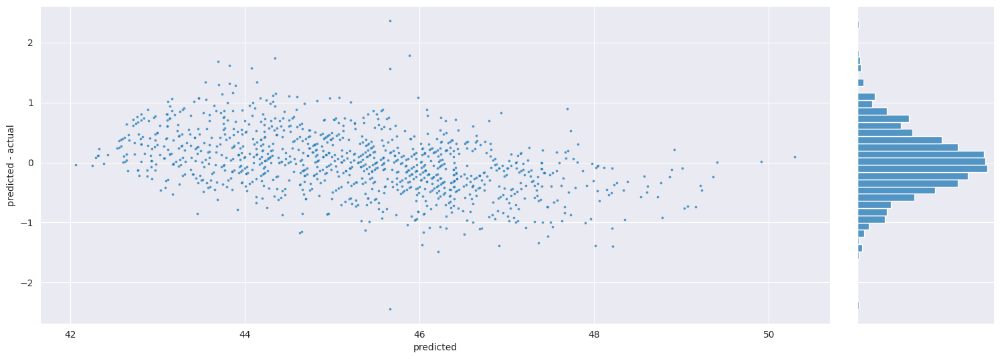

<Figure size 1000x800 with 0 Axes>

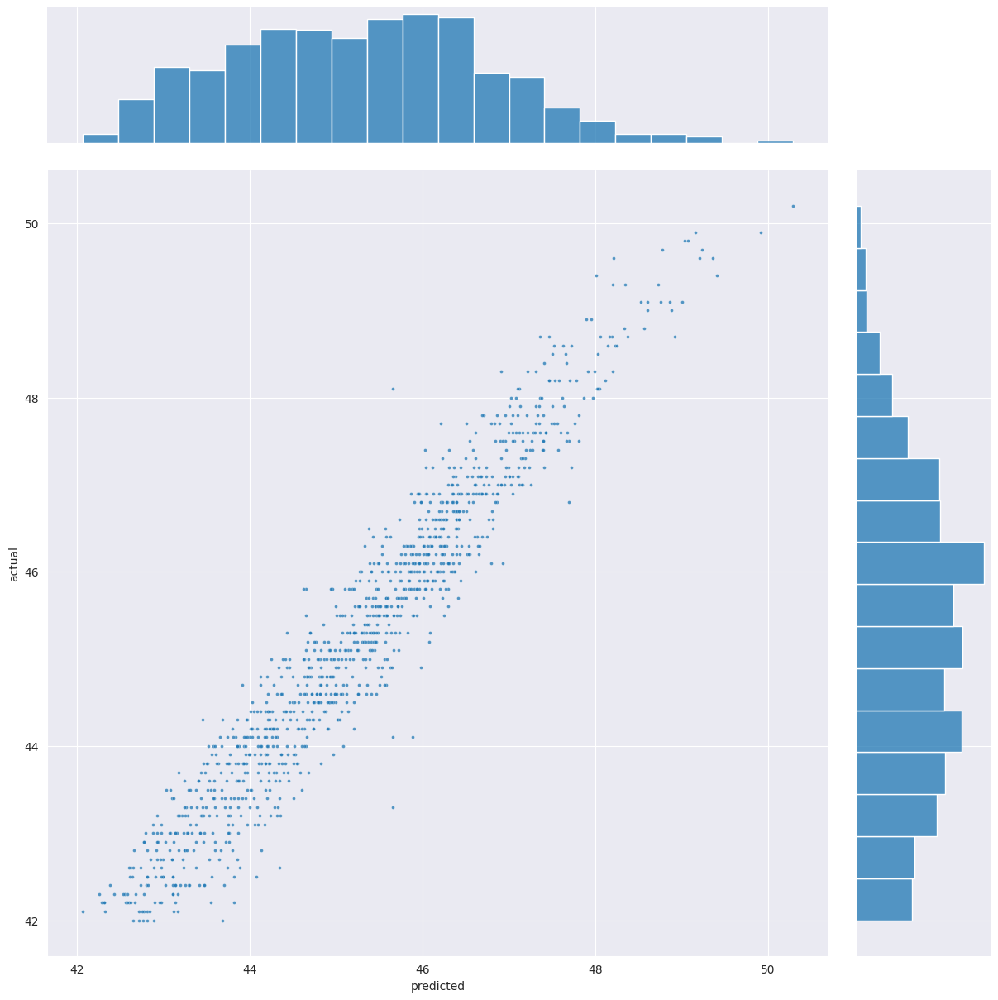

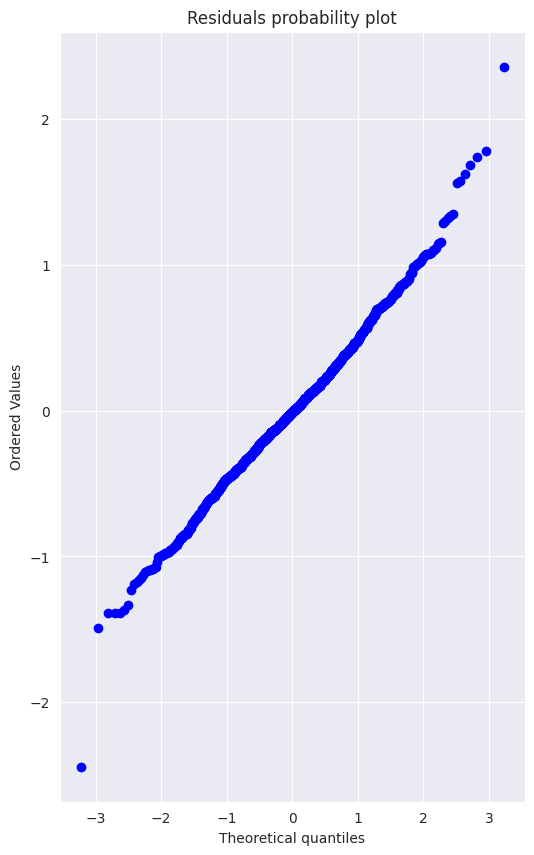

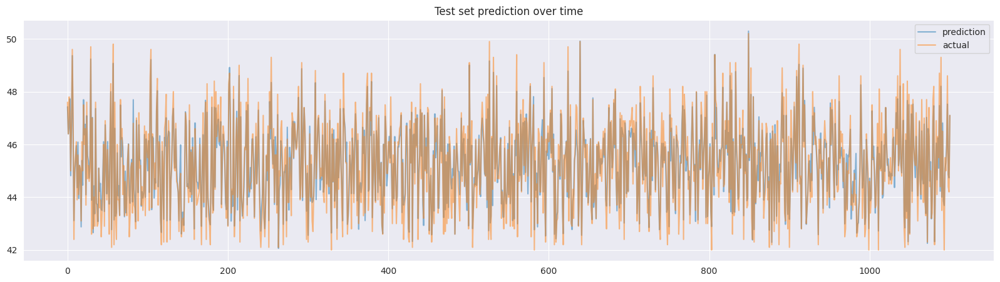

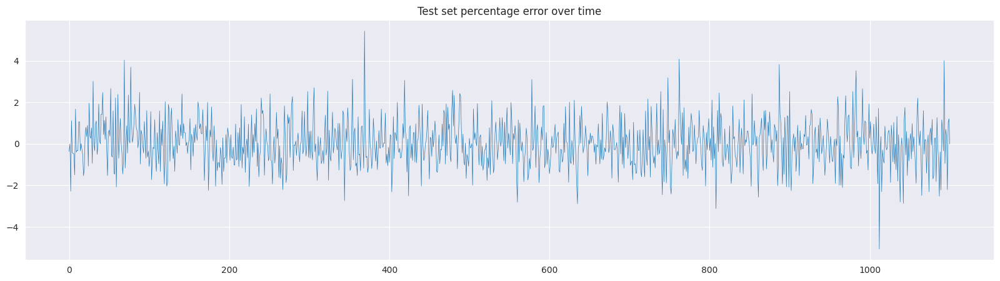

In [65]:
y_train_pred = model.predict(X_train)
evaluate(y_train.to_numpy(), y_train_pred)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


MAE = 0.5067535432742744
MSE = 0.6154738799306788
RMSE = 0.784521433697435
MAPE = 0.011193281522365721
R^2 = 0.796707077120357
Explained Variance Score = 0.7967080973986471

Residuals summary stats
╒═══════╤═════════════╕
│ count │         252 │
├───────┼─────────────┤
│ mean  │  0.00175753 │
├───────┼─────────────┤
│ std   │    0.786081 │
├───────┼─────────────┤
│ min   │    -5.27097 │
├───────┼─────────────┤
│ 25%   │   -0.325582 │
├───────┼─────────────┤
│ 50%   │ -0.00563431 │
├───────┼─────────────┤
│ 75%   │    0.320011 │
├───────┼─────────────┤
│ max   │     3.16894 │
╘═══════╧═════════════╛

Deviation from mean of residuals
╒════════════╤══════════╤════════════╕
│ Interval   │   Actual │   Expected │
╞════════════╪══════════╪════════════╡
│ μ ± σ      │  79.7619 │       68.2 │
├────────────┼──────────┼────────────┤
│ μ ± 2σ     │  95.2381 │       95.4 │
├────────────┼──────────┼────────────┤
│ μ ± 3σ     │  98.0159 │       99.7 │
╘════════════╧══════════╧════════════╛

Jarque-B

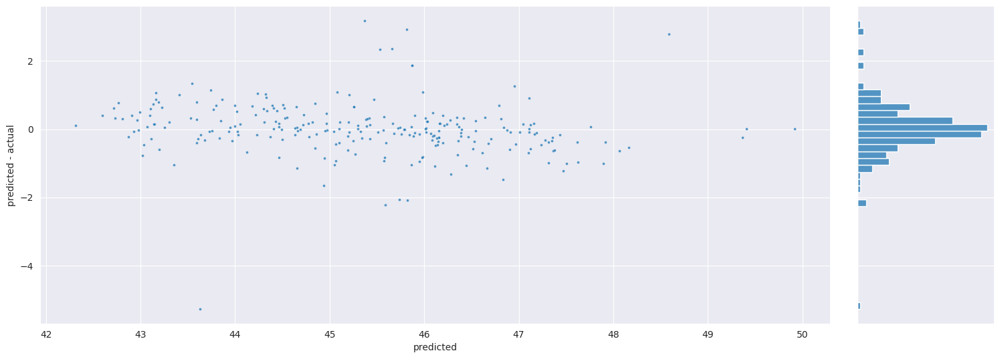

<Figure size 1000x800 with 0 Axes>

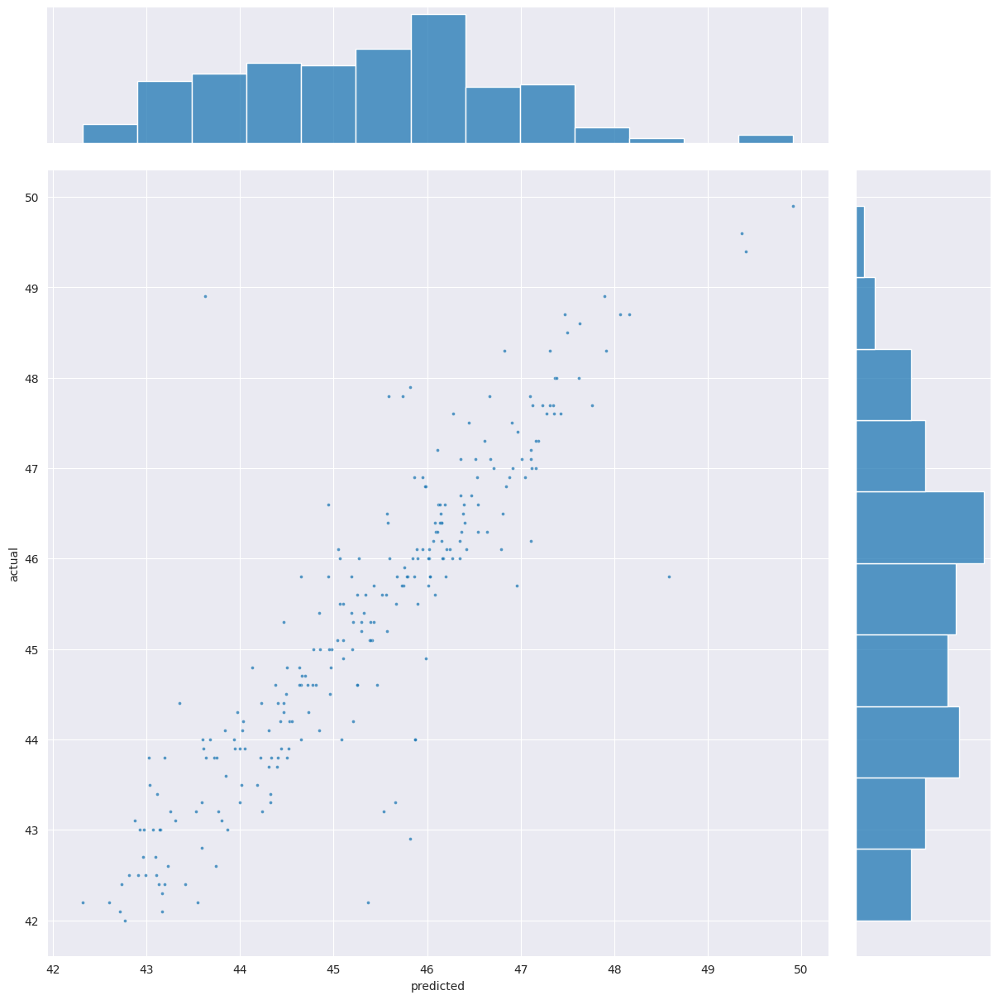

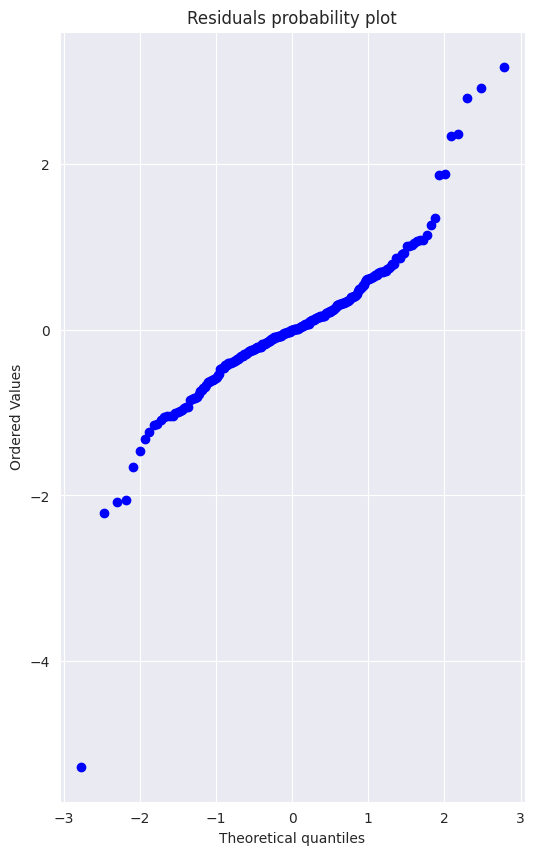

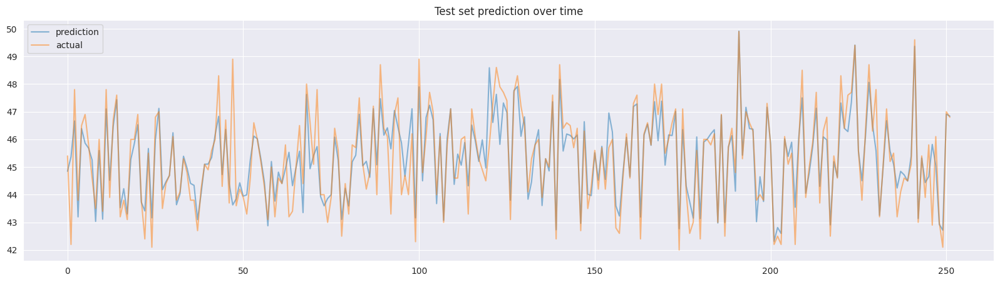

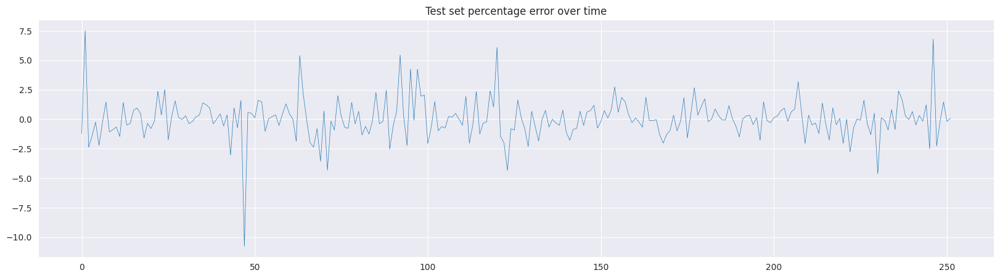

In [66]:
y_valid_pred = model.predict(X_valid)
evaluate(y_valid.to_numpy(), y_valid_pred)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


MAE = 1.198545900420646
MSE = 2.2943275331187425
RMSE = 1.5147037773501268
MAPE = 0.026507636682629093
R^2 = 0.23878122279937697
Explained Variance Score = 0.23883208030069036

Residuals summary stats
╒═══════╤════════════╕
│ count │        472 │
├───────┼────────────┤
│ mean  │ -0.0123809 │
├───────┼────────────┤
│ std   │    1.51626 │
├───────┼────────────┤
│ min   │   -5.27097 │
├───────┼────────────┤
│ 25%   │   -0.94368 │
├───────┼────────────┤
│ 50%   │  -0.140085 │
├───────┼────────────┤
│ 75%   │   0.948071 │
├───────┼────────────┤
│ max   │    4.96128 │
╘═══════╧════════════╛

Deviation from mean of residuals
╒════════════╤══════════╤════════════╕
│ Interval   │   Actual │   Expected │
╞════════════╪══════════╪════════════╡
│ μ ± σ      │  68.6441 │       68.2 │
├────────────┼──────────┼────────────┤
│ μ ± 2σ     │  95.7627 │       95.4 │
├────────────┼──────────┼────────────┤
│ μ ± 3σ     │  99.5763 │       99.7 │
╘════════════╧══════════╧════════════╛

Jarque-Bera Test on Re

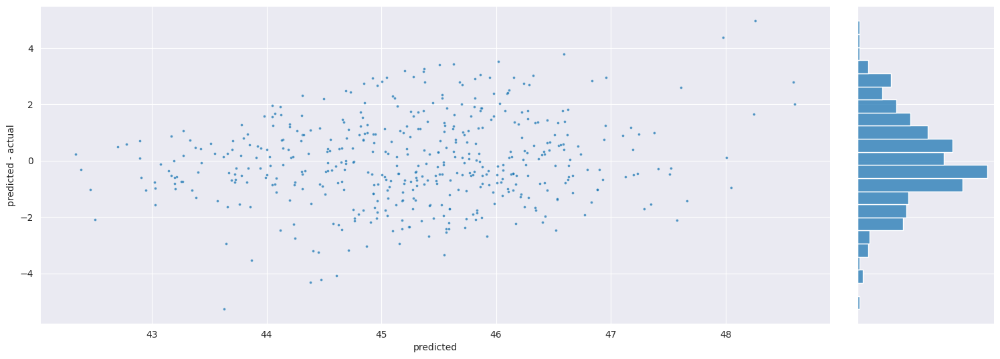

<Figure size 1000x800 with 0 Axes>

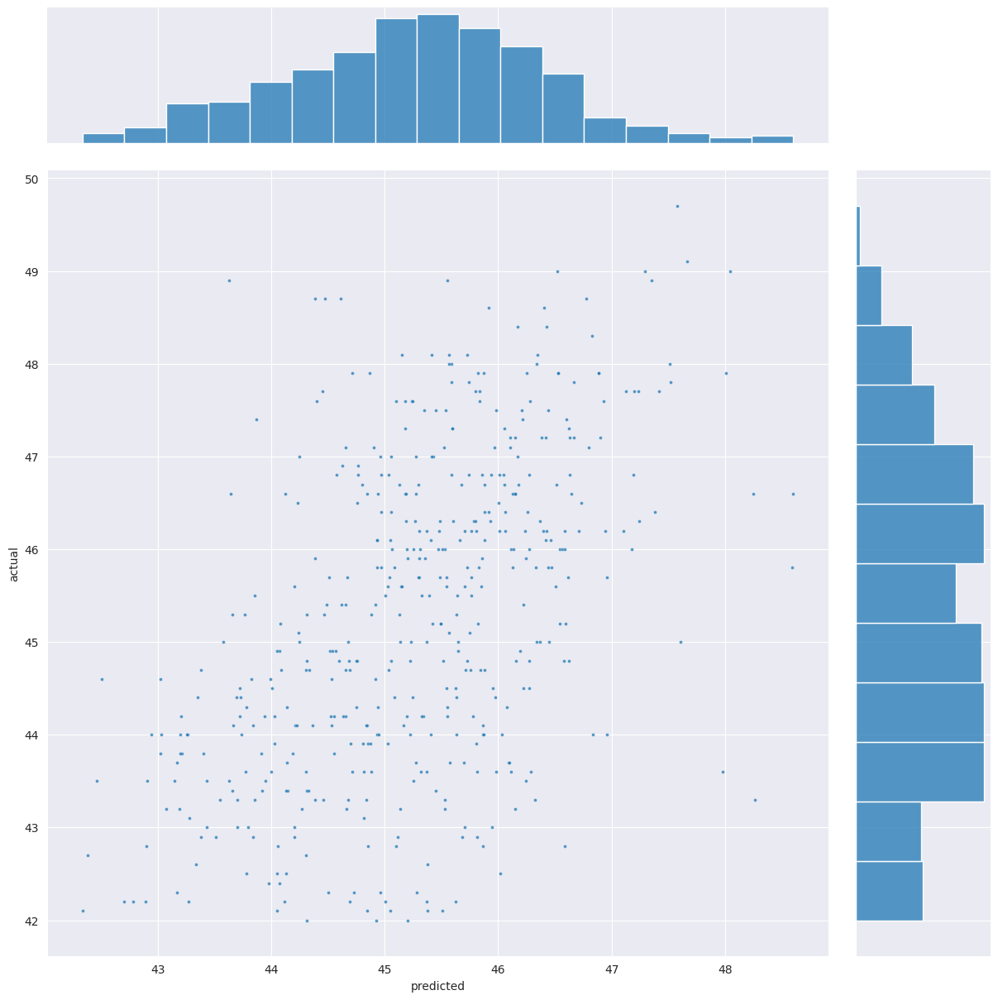

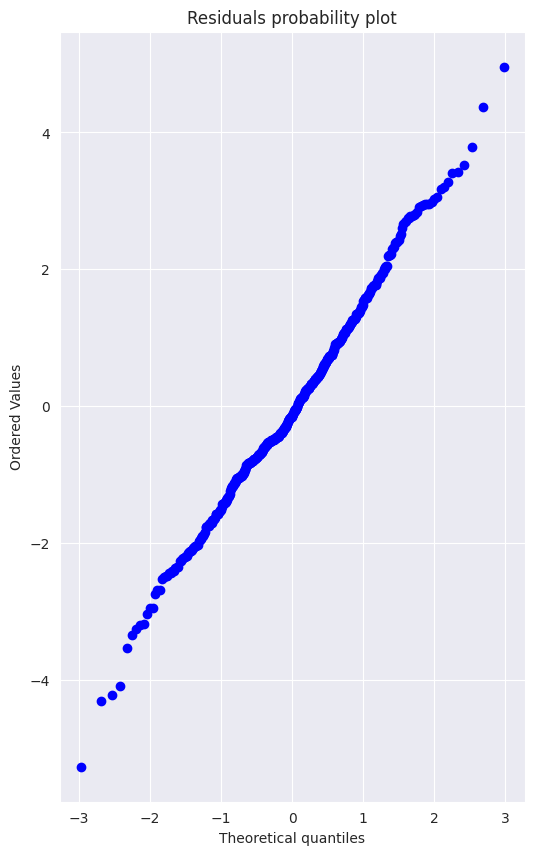

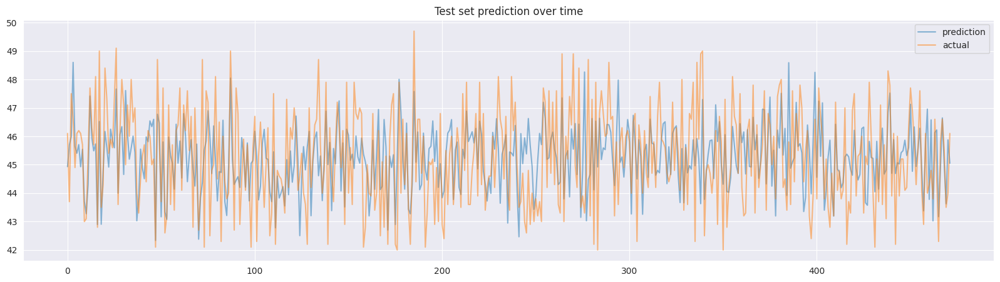

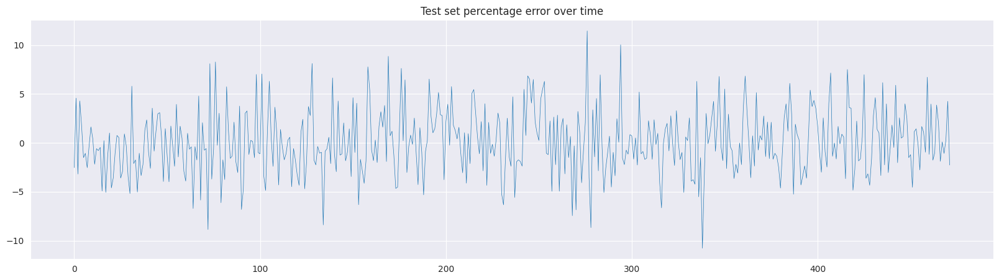

In [67]:
y_pred = model.predict(X_test)
evaluate(y_test.to_numpy(), y_pred)

In [68]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
# define an additional metric 
def MAPE(true, pred):
    diff = np.abs(np.array(true) - np.array(pred))
    return np.mean(diff / abs(true))

In [69]:
print("Training R2:", r2_score(y_train, y_train_pred), "traing RMSE:", np.sqrt(mean_squared_error(y_train, y_train_pred)), "training MAE:", mean_absolute_error(y_train, y_train_pred), "MAPE:", MAPE(y_train, y_train_pred)*100,"%")

Training R2: 0.9141038598126483 traing RMSE: 0.5113590090473331 training MAE: 0.3946699788653603 MAPE: 0.8735458422842639 %


In [70]:
print("Testing R2:", r2_score(y_test, y_pred), "Testing RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)), "Testing MAE:", mean_absolute_error(y_test, y_pred), "MAPE:", MAPE(y_test, y_pred)*100,"%")

Testing R2: 0.23878122279937697 Testing RMSE: 1.5147037773501268 Testing MAE: 1.198545900420646 MAPE: 2.6507636682629094 %


In [71]:
print("Valid R2:", r2_score( y_valid, y_valid_pred), "valid RMSE:", np.sqrt(mean_squared_error(y_valid, y_valid_pred)), "Testing MAE:", mean_absolute_error(y_valid, y_valid_pred), "MAPE:", MAPE(y_valid, y_valid_pred)*100,"%")

Valid R2: 0.796707077120357 valid RMSE: 0.784521433697435 Testing MAE: 0.5067535432742744 MAPE: 1.1193281522365721 %


In [25]:
import os
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
from tabulate import tabulate
import matplotlib.pyplot as plt
from scipy.stats import probplot
from statsmodels.stats.stattools import jarque_bera
from sklearn import metrics


def combine_data():
    data = []
    for file in sorted(os.listdir("pp_gas_emission")):
        df = pd.read_csv(f"./pp_gas_emission/{file}")
        df['year'] = int(file[3:7])
        data.append(df)
    df = pd.concat(data)
    df.drop_duplicates(inplace=True)
    df.reset_index(inplace=True, drop=True)
    df["target"] = df["TEY"].shift(-1)
    df.drop(df.tail(1).index, inplace=True)
    df.to_parquet("pp_gas_emission.parquet")


def evaluate(y_test, y_pred):
    mae = metrics.mean_absolute_error(y_test, y_pred)
    mse = metrics.mean_squared_error(y_test, y_pred)
    rmse = metrics.mean_squared_error(y_test, y_pred, squared=False)
    r2 = metrics.r2_score(y_test, y_pred)
    explained_var_score = metrics.explained_variance_score(y_test, y_pred)
    mape = metrics.mean_absolute_percentage_error(y_test, y_pred)
    print(f"MAE = {mae}")
    print(f"MSE = {mse}")
    print(f"RMSE = {rmse}")
    print(f"MAPE = {mape}")
    print(f"R^2 = {r2}")
    print(f"Explained Variance Score = {explained_var_score}")

    residuals = y_pred - y_test
    print("\nResiduals summary stats")
    print(tabulate(
        pd.Series(residuals).describe().to_frame(),
        numalign="right", tablefmt="fancy_grid",
    ))

    with sns.axes_style("darkgrid"):
        g = sns.jointplot(x=y_pred, y=y_pred-y_test, s=8, alpha=0.75, height=12)
        g.set_axis_labels('predicted', 'predicted - actual')
        g.fig.set_figwidth(15)
        g.fig.set_figheight(6)
        g.ax_marg_x._visible = False

        plt.figure(figsize=(10, 8))
        g = sns.jointplot(x=y_pred, y=y_test, s=8, alpha=0.75, height=12)
        g.set_axis_labels('predicted', 'actual')

        fig, ax = plt.subplots(1, 1, figsize=(6, 10))
        probplot(residuals, sparams=(0, 1), plot=ax, fit=False)
        ax.set_title("Residuals probability plot")

        plt.figure(figsize=(20, 5))
        plt.plot(y_pred, alpha=0.5, label="prediction")
        plt.plot(y_test, alpha=0.5, label="actual")
        plt.legend()
        plt.title("Test set prediction over time")
        
        plt.figure(figsize=(20, 5))
        plt.plot(100*(residuals)/y_test, linewidth=0.5)
        plt.title("Test set percentage error over time")
    
    res_mean = residuals.mean()
    res_std = residuals.std()

    one_std_condition = ((residuals >= res_mean - 1*res_std) & (residuals <= res_mean + 1*res_std))
    two_std_condition = ((residuals >= res_mean - 2*res_std) & (residuals <= res_mean + 2*res_std))
    three_std_condition = ((residuals >= res_mean - 3*res_std) & (residuals <= res_mean + 3*res_std))
    perc_within_one_std = 100*len(residuals[np.where(one_std_condition)])/len(residuals)
    perc_within_two_std = 100*len(residuals[np.where(two_std_condition)])/len(residuals)
    perc_within_three_std = 100*len(residuals[np.where(three_std_condition)])/len(residuals)

    print("\nDeviation from mean of residuals")
    print(tabulate(pd.DataFrame({
        "μ ± σ": {"actual": perc_within_one_std, "expected": 68.2},
        "μ ± 2σ": {"actual": perc_within_two_std, "expected": 95.4},
        "μ ± 3σ": {"actual": perc_within_three_std, "expected": 99.7},  
    }).T, headers=["Interval", "Actual", "Expected"], tablefmt="fancy_grid"))
    
    print("\nJarque-Bera Test on Residuals")
    result = jarque_bera(residuals)
    result_labels = ("JB-Statistic", "Chi2-P-value", "Skew", "Kurtosis")
    print(tabulate(list(zip(result_labels, result)), tablefmt="fancy_grid"))


def plot_importance(model):
    # with sns.set_style("whitegrid"):
    with plt.style.context('ggplot'):
        fig, axes = plt.subplots(1, 3, figsize=(18, 18))
        fig.tight_layout(pad=8)
        axes[0] = xgb.plot_importance(model, ax=axes[0],
                                      importance_type="weight",
                                      xlabel="weight")
        axes[1] = xgb.plot_importance(model, ax=axes[1],
                                      importance_type="gain",
                                      xlabel="gain")
        axes[2] = xgb.plot_importance(model, ax=axes[2],
                                      importance_type="cover",
                                      xlabel="cover")
        for ax, title in zip(axes, ["weight", "gain", "cover"]):
            ax.set_title(f"Features ranked by {title}")
            ax.set_ylabel(None)
            ax.tick_params(axis="x", labelsize=10)
            ax.tick_params(axis="y", labelsize=10)
            for txt_obj in ax.texts:
                curr_text = txt_obj.get_text()
                new_text = round(float(curr_text), 1)
                txt_obj.set_text(new_text)
    return


def plot_history(model):
    # with sns.set_style("whitegrid"):
    with plt.style.context('ggplot'):
        history = model.evals_result()
        fig, ax = plt.subplots(1, 1, figsize=(14, 5))
        ax.plot(range(len(history['validation_0']['rmse'])),
                history['validation_0']['rmse'],
                label="Training RMSE", linewidth=2)
        ax.plot(range(len(history['validation_1']['rmse'])),
                history['validation_1']['rmse'],
                label="Testing RMSE", linewidth=2)
        ax.set_title('RMSE')
        ax.grid(True)
        ax.legend()
    return


def rolling_means(df, window, min_periods, cols=None):
    cols = cols or df.columns.to_list()
    df_roll = (df[cols]
               .rolling(window, min_periods=min_periods)
               .mean()
               .fillna(df))
    df_roll.columns = df_roll.columns.map(lambda c: f"{c}_ROLL{window}_MEAN")
    return df_roll


def rolling_standard_deviation(df, window, min_periods, cols=None):
    cols = cols or df.columns.to_list()
    df_roll = (df[cols]
               .rolling(window, min_periods=min_periods)
               .std()
               .fillna(1))
    df_roll.columns = df_roll.columns.map(lambda c: f"{c}_ROLL{window}_STD")
    return df_roll


def lagged_features(df, lags, cols=None):
    if isinstance(lags, int):
        lags = range(1, lags+1)
    cols = cols or df.columns.to_list()
    data = []
    for lag in lags:
        lagged_data = df[cols].shift(lag).fillna(df)
        lagged_data.columns = lagged_data.columns.map(lambda c: f"{c}_LAG{lag}")
        data.append(lagged_data)
    return pd.concat(data, axis="columns")

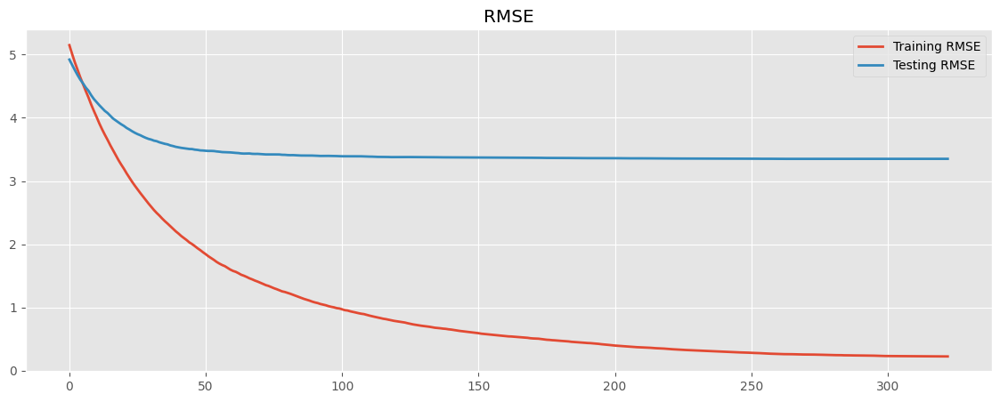

In [26]:
plot_history(model)

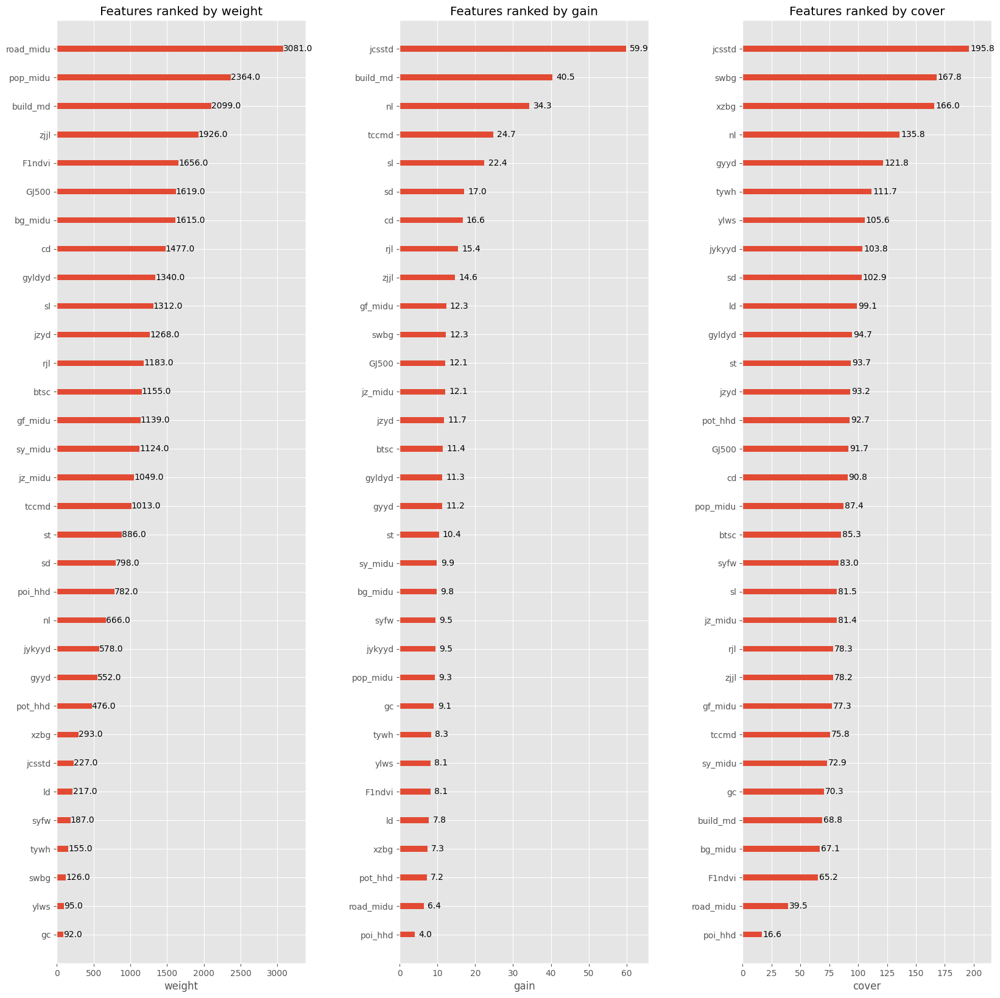

In [27]:
plot_importance(model)

In [28]:
import shap

In [29]:
cols = ['poi_hhd', 'road_midu', 'build_md','pop_midu','rjl','bg_midu','gf_midu','sy_midu','jz_midu','tccmd','F1ndvi','GJ500','zjjl',"jcsstd","gyldyd","gyyd","jykyyd","jzyd","swbg","syfw","tywh","xzbg","ylws","jtczyd","nl","sl","cd","gc","sd","st","btsc","ld",'pot_hhd',]

In [30]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(data[cols])
print(shap_values.shape)
np.savetxt('shap values.csv', shap_values, delimiter = ',') 
y_base = explainer.expected_value
print(y_base)
data['pred'] = model.predict(data[cols])
print(data['pred'].mean())

[10:30:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


(2384, 33)
33.80676
33.76183


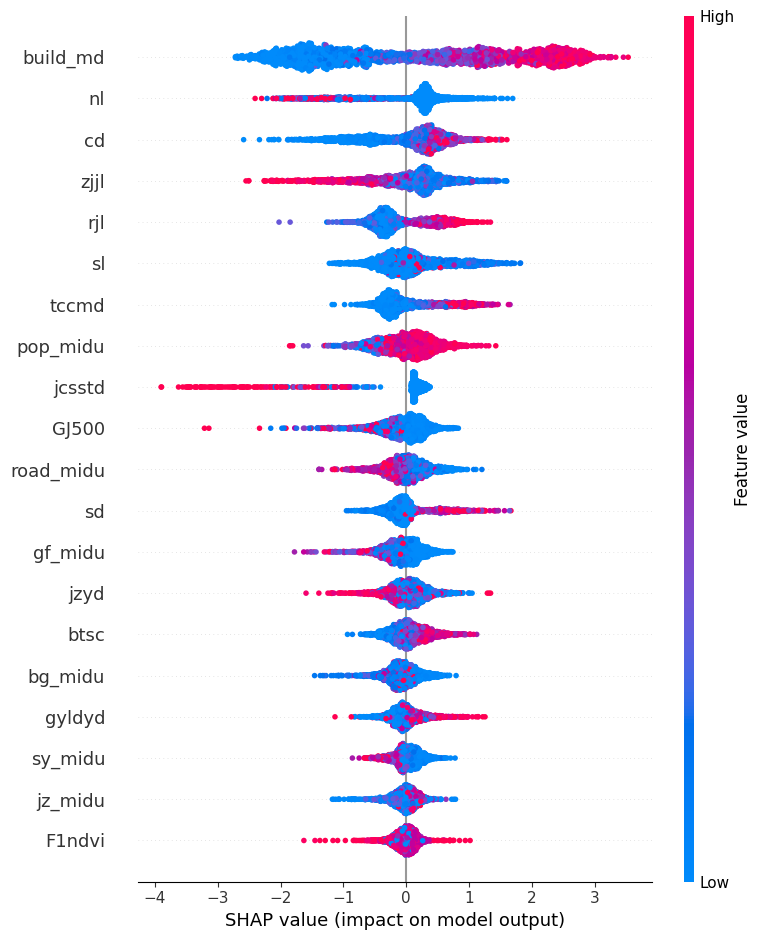

In [31]:
shap.summary_plot(shap_values, data[cols])

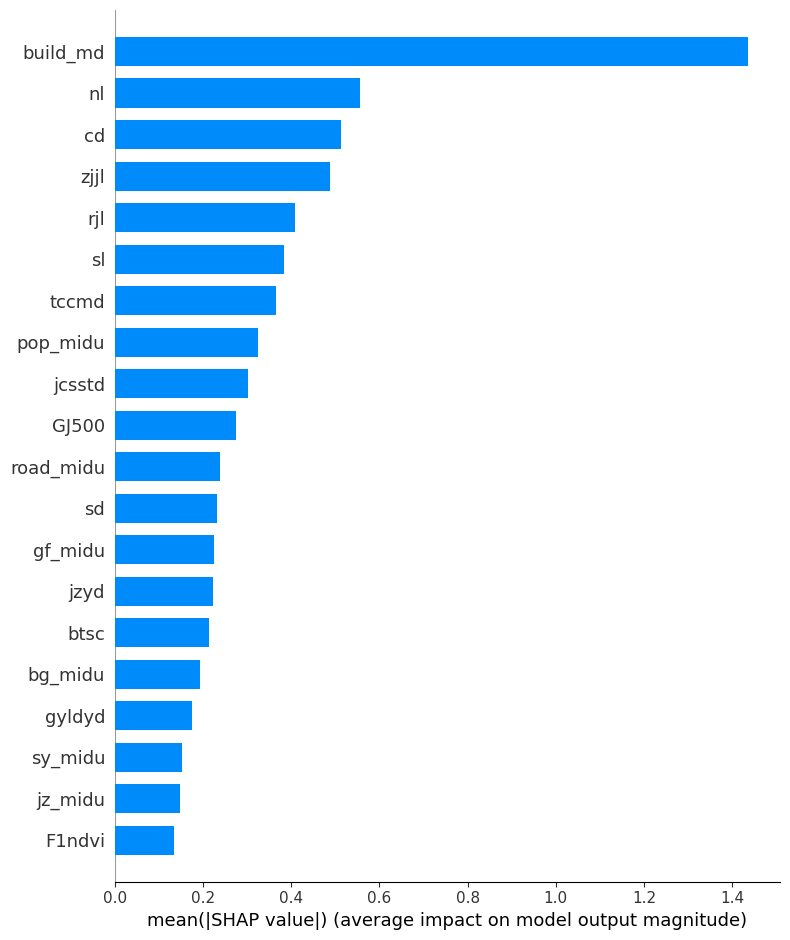

In [32]:
shap.summary_plot(shap_values, data[cols], plot_type="bar")

In [33]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(data[cols])

[10:31:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


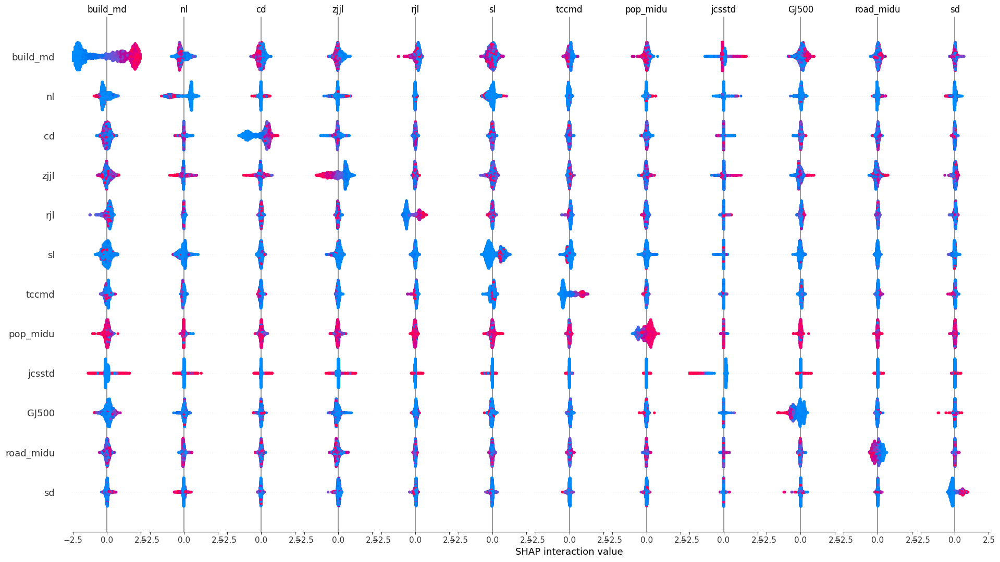

In [34]:
shap.summary_plot(shap_interaction_values, data[cols], max_display=12)

In [35]:
plt.rcParams['font.size'] = 14
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = 'Times New Roman'

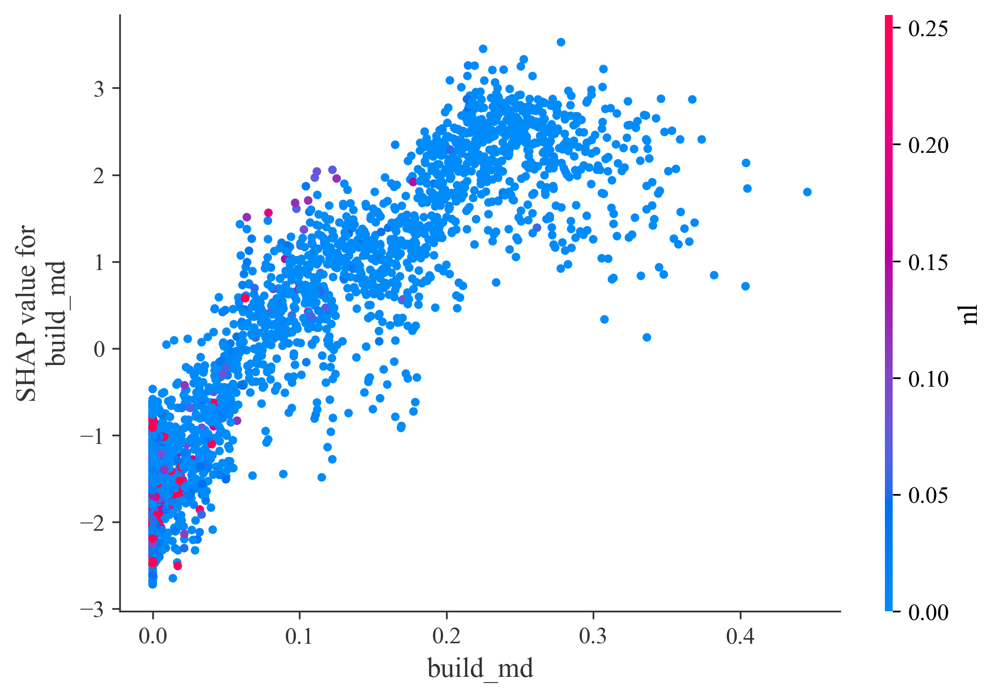

In [36]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='nl', show=False)

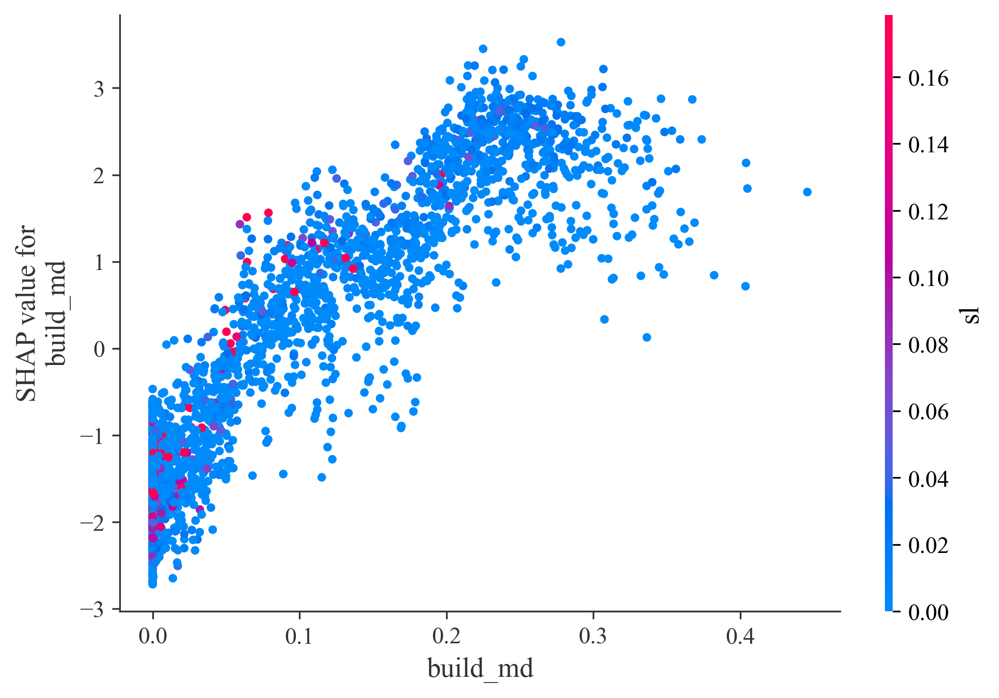

In [46]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='sl', show=False)

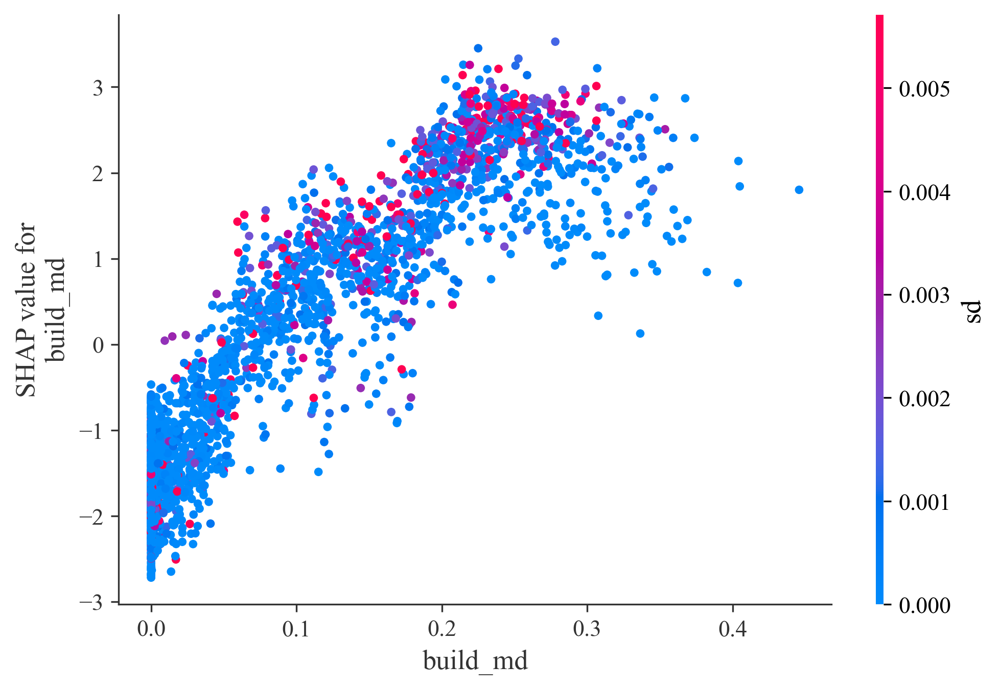

In [47]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='sd', show=False)

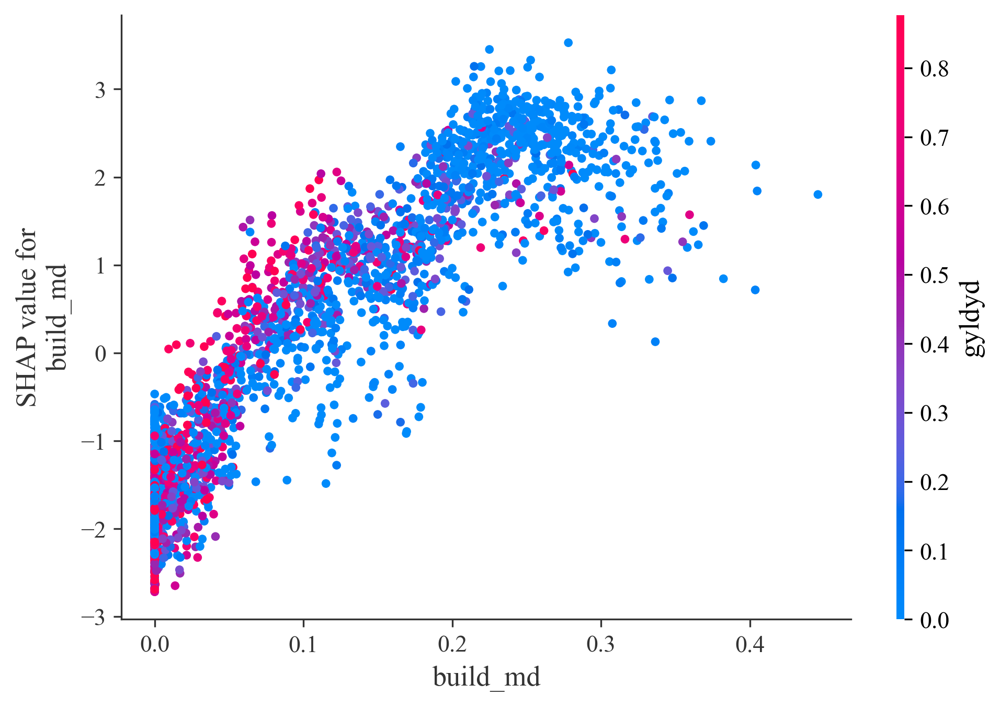

In [48]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='gyldyd', show=False)

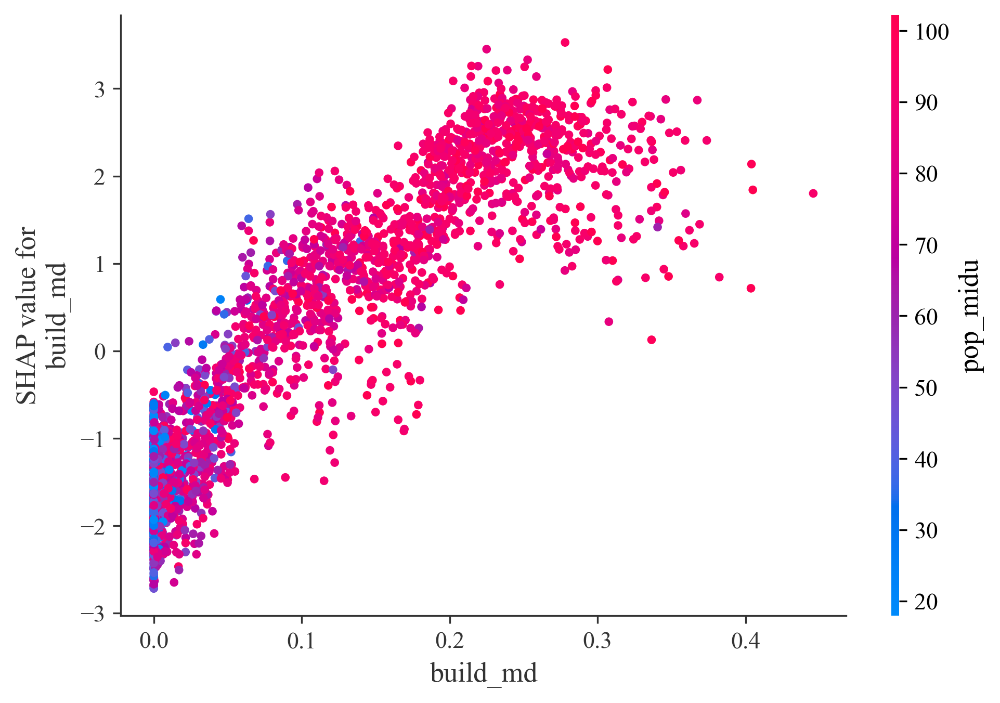

In [49]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='pop_midu', show=False)

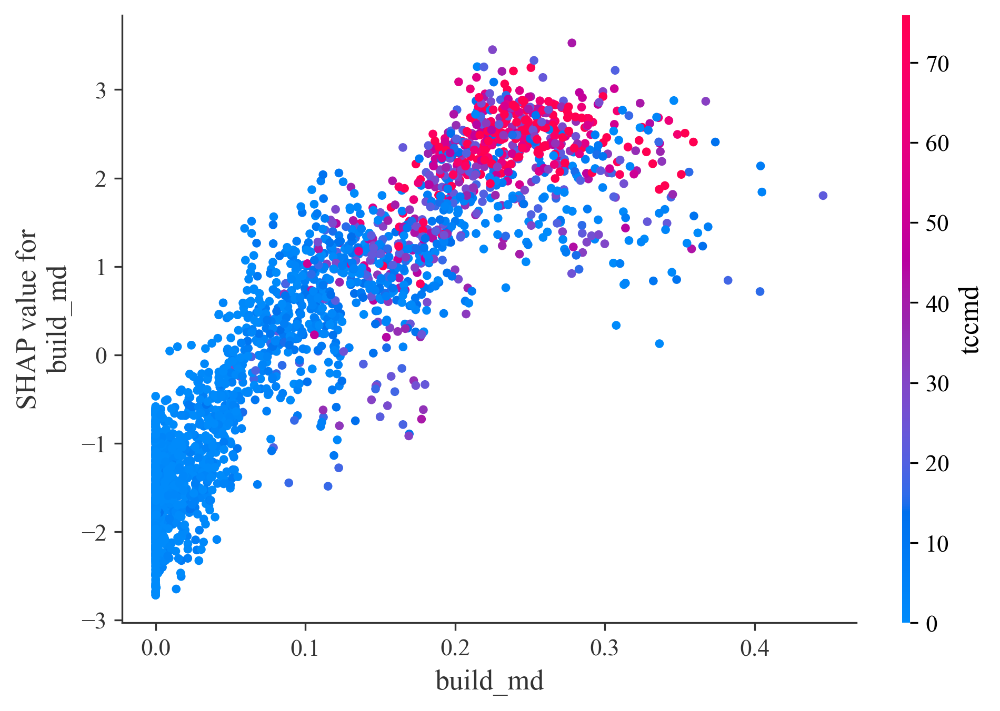

In [50]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='tccmd', show=False)

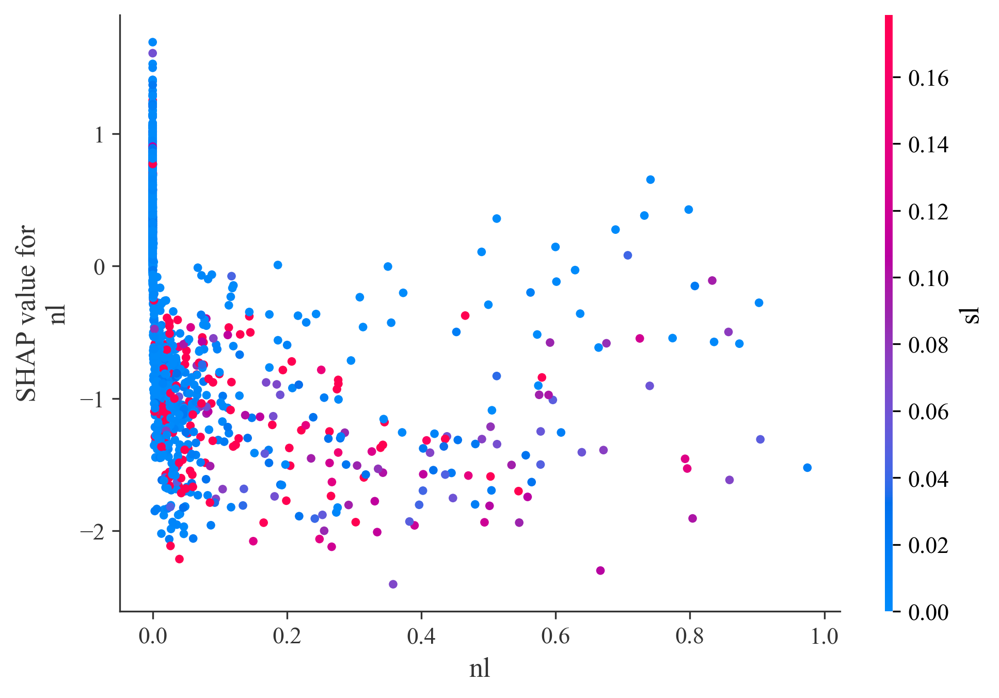

In [51]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='sl', show=False)

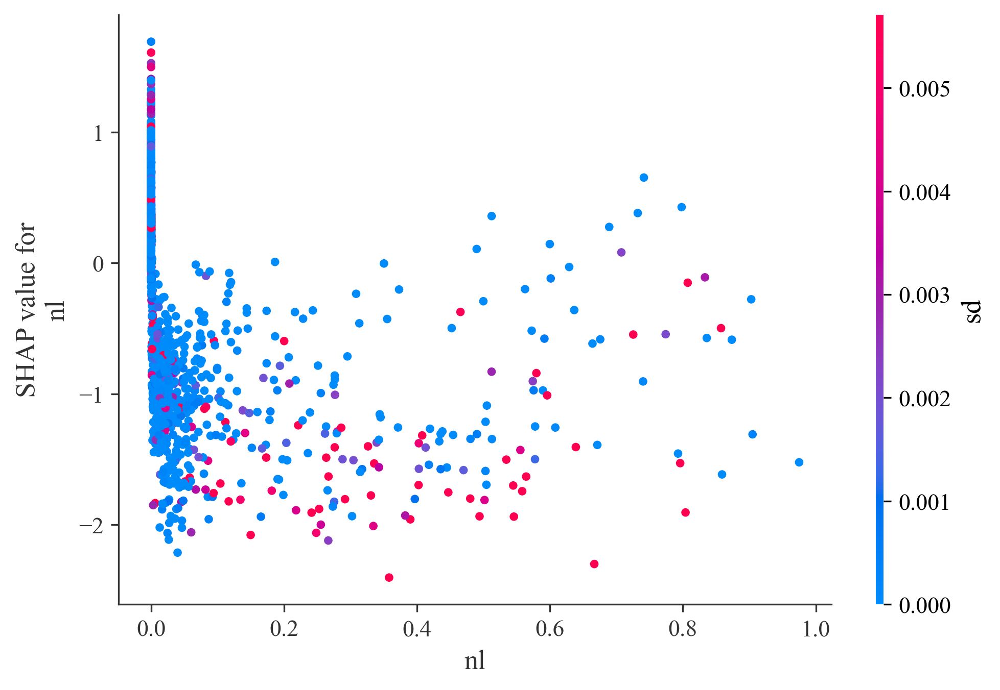

In [52]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='sd', show=False)

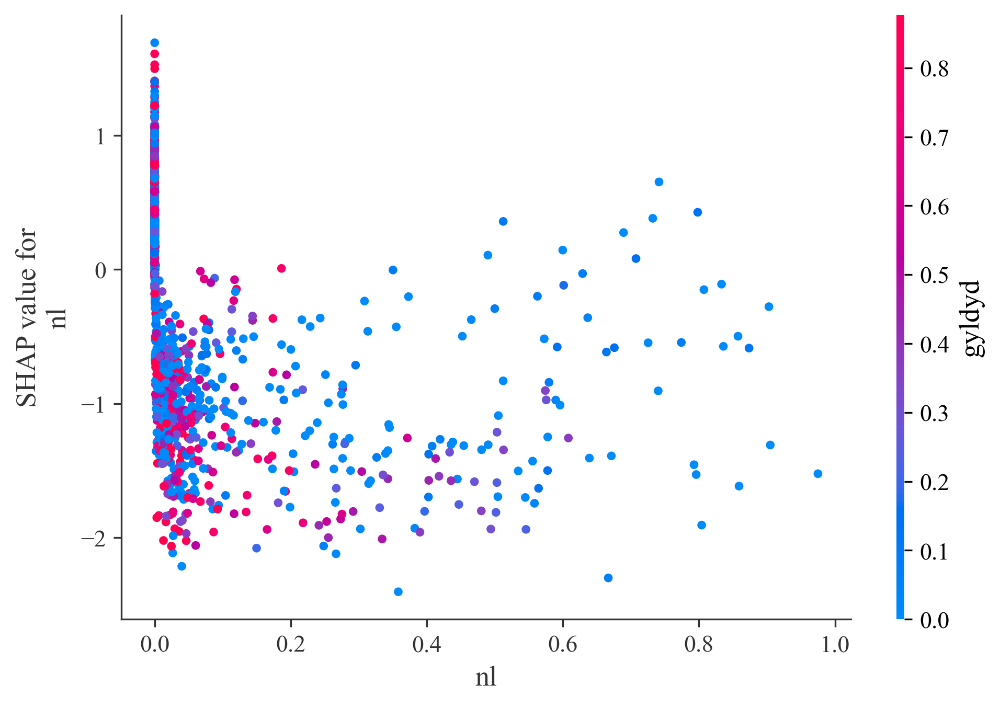

In [53]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='gyldyd', show=False)

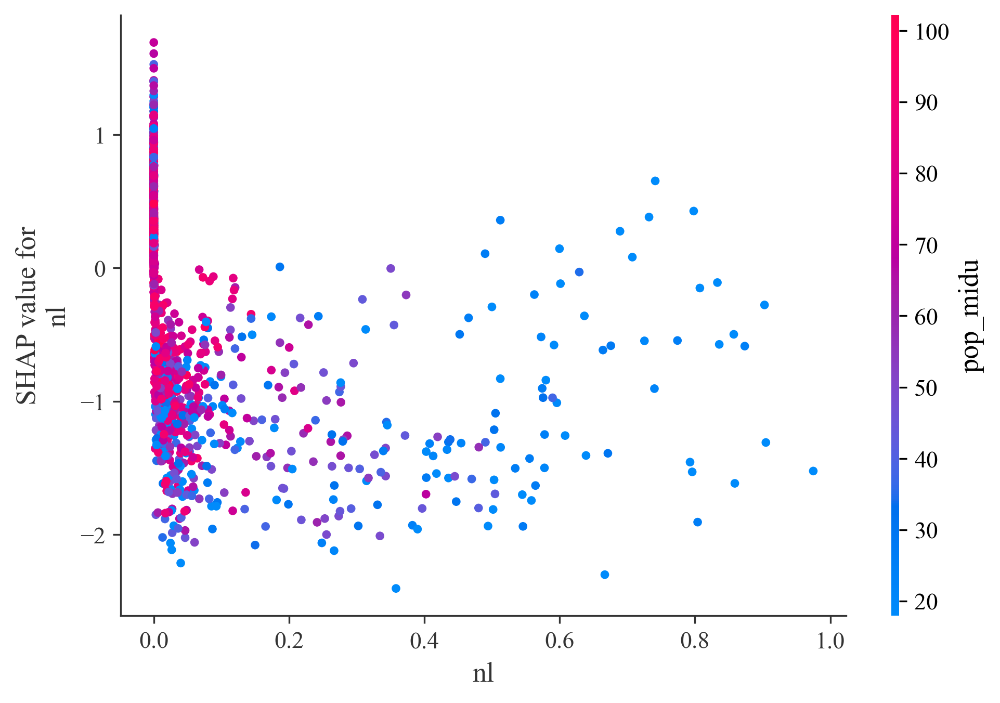

In [54]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='pop_midu', show=False)

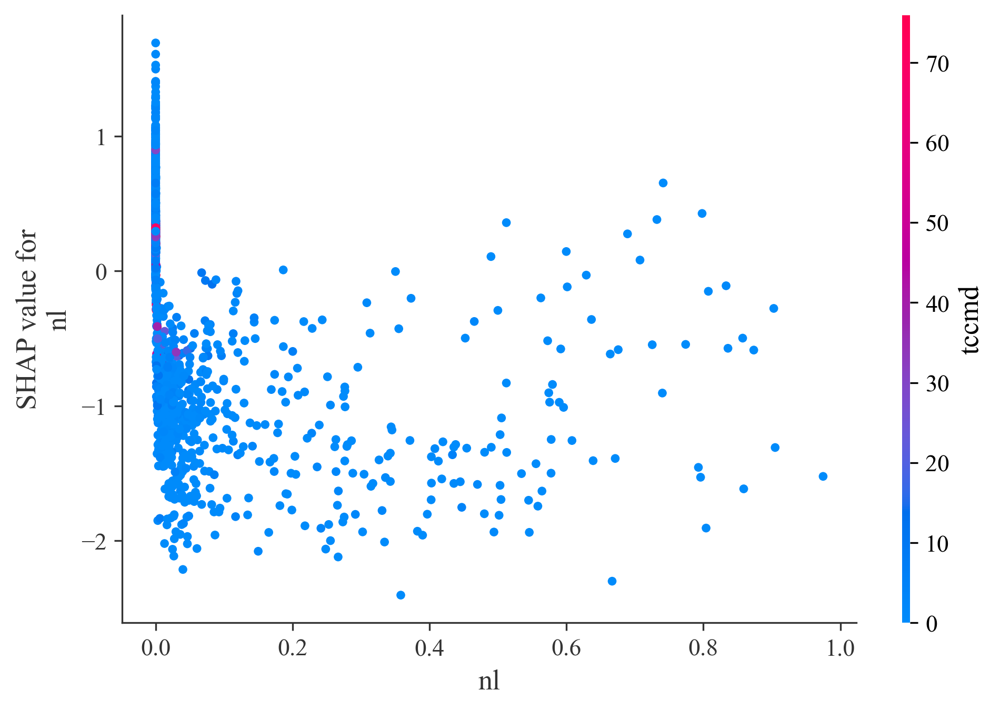

In [55]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='tccmd', show=False)

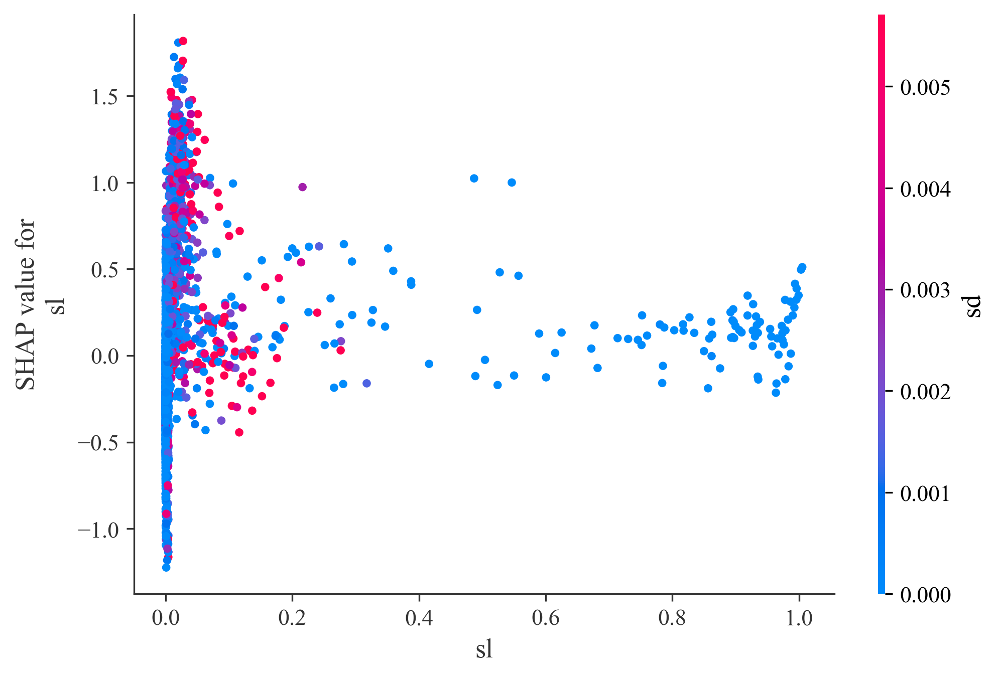

In [56]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='sd', show=False)

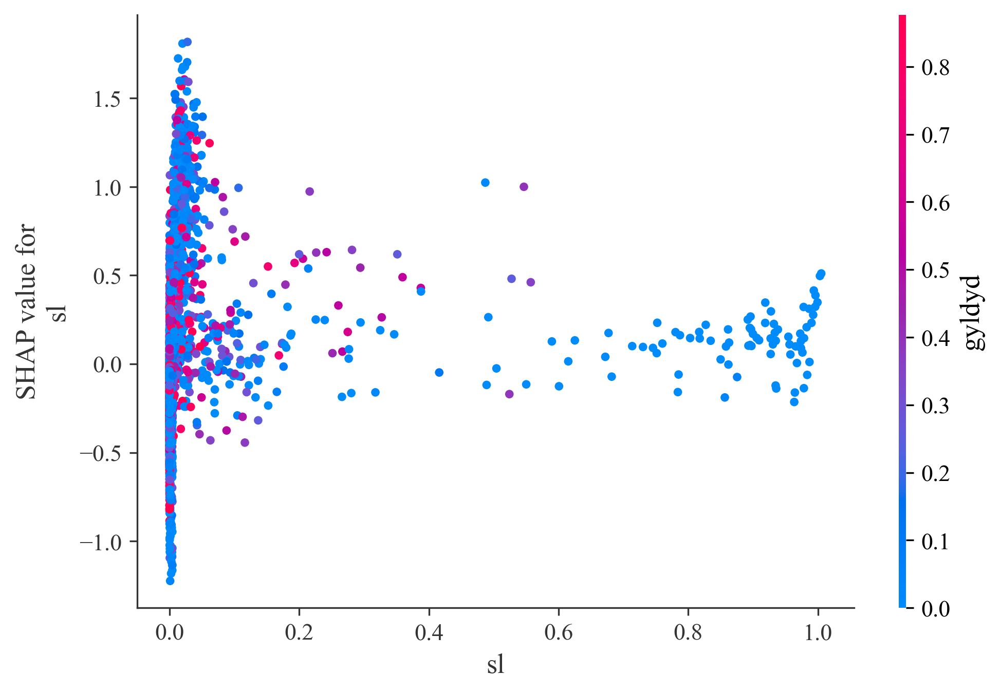

In [57]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='gyldyd', show=False)

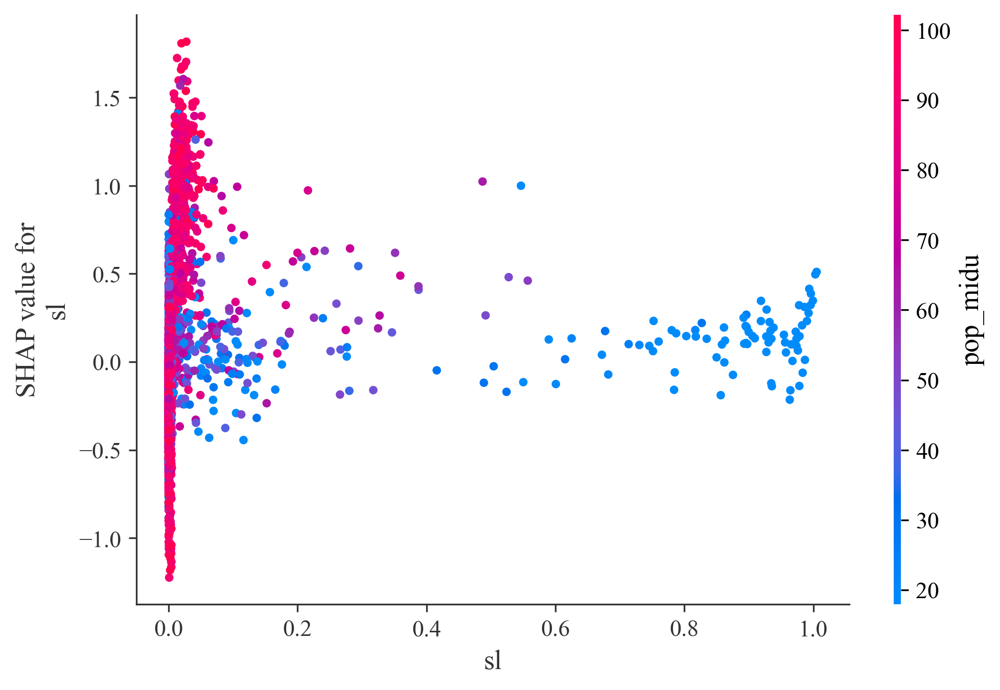

In [58]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='pop_midu', show=False)

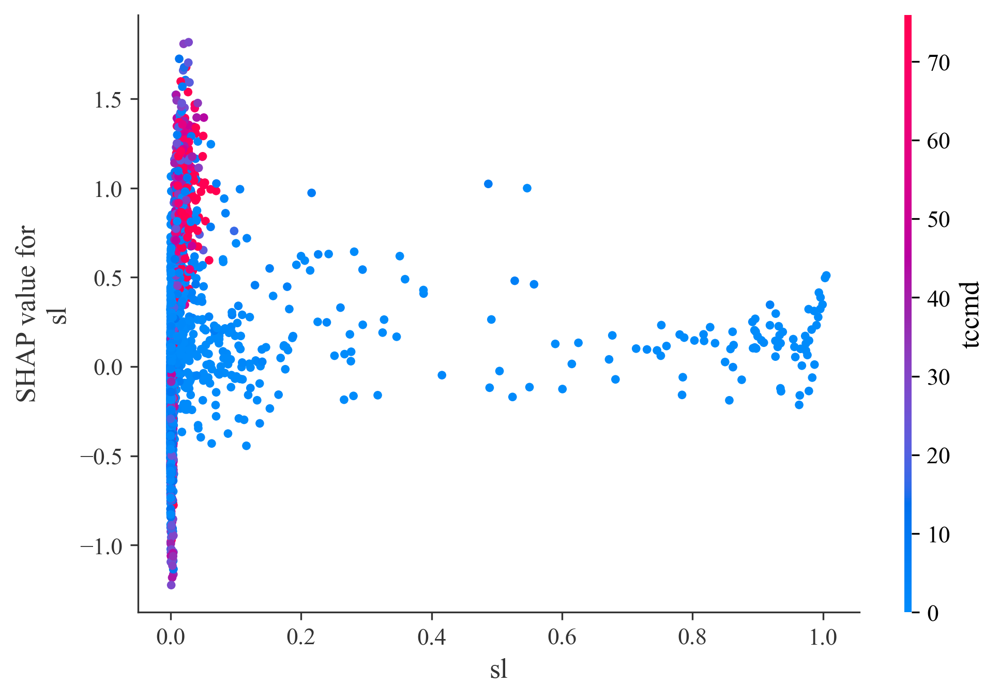

In [59]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='tccmd', show=False)

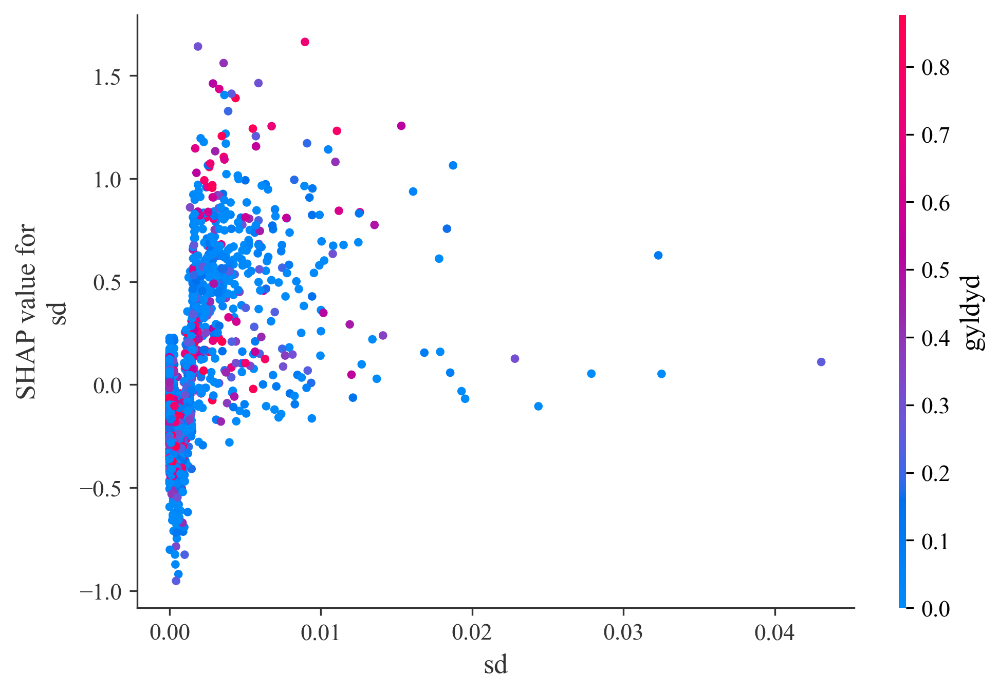

In [60]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sd', shap_values, data[cols], interaction_index='gyldyd', show=False)

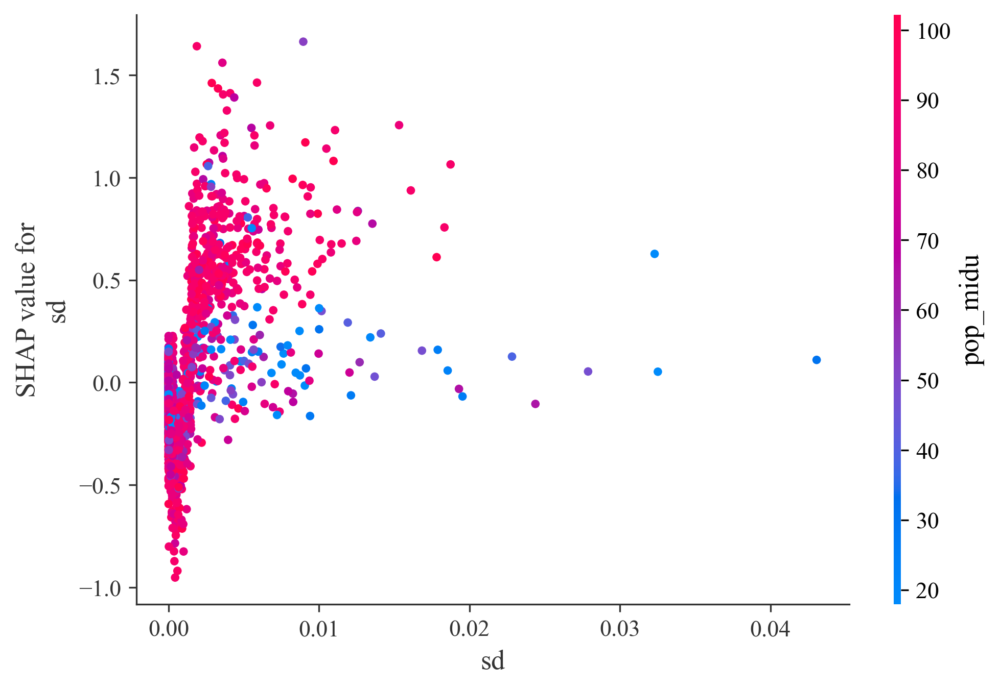

In [61]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sd', shap_values, data[cols], interaction_index='pop_midu', show=False)

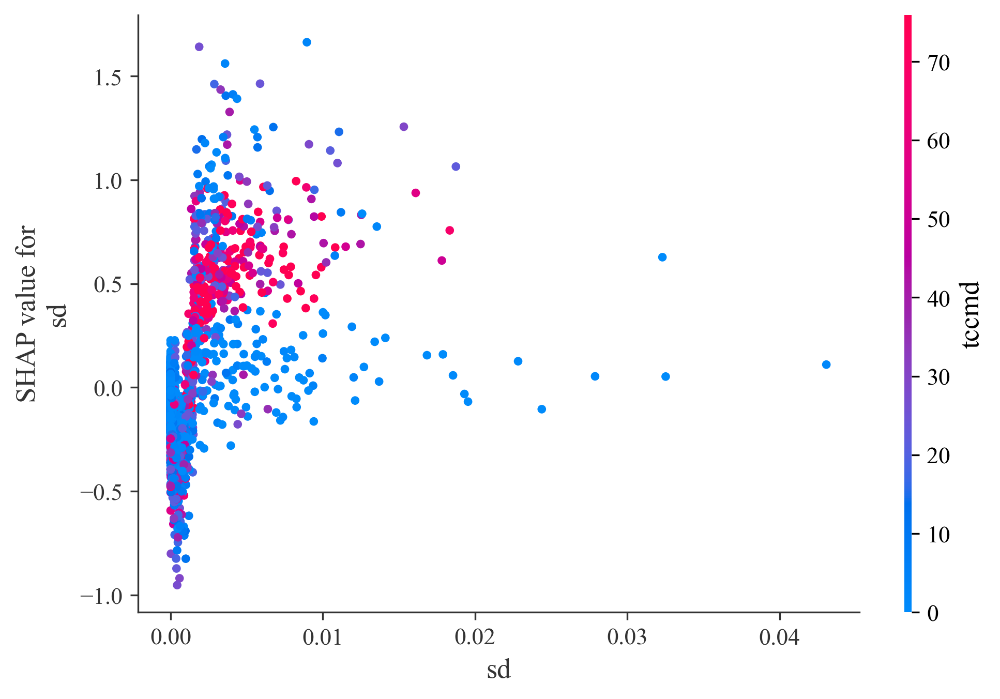

In [62]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sd', shap_values, data[cols], interaction_index='tccmd', show=False)

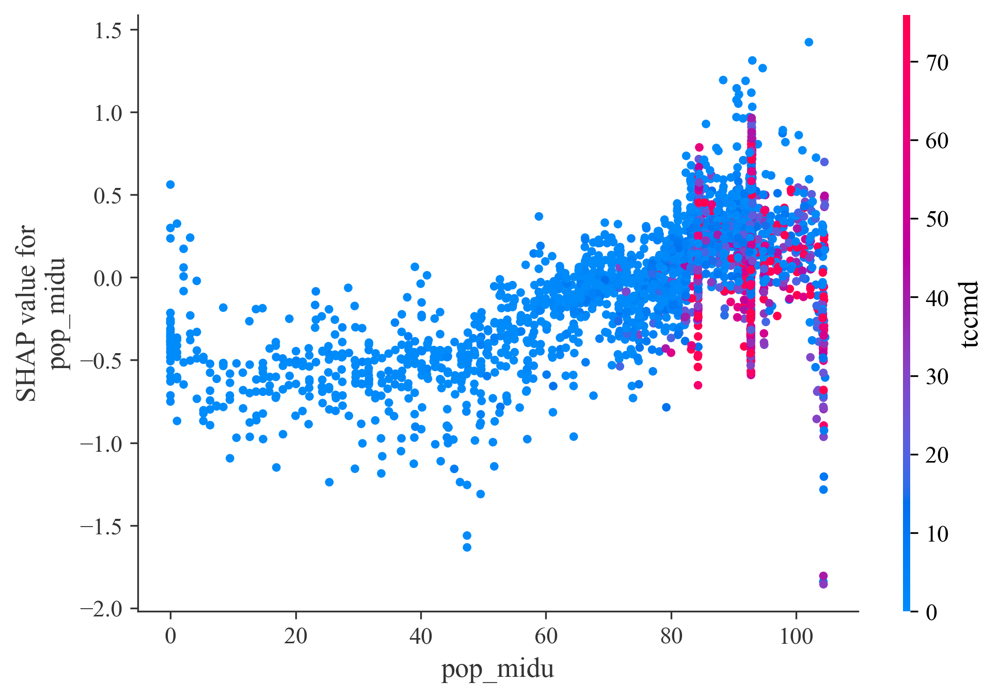

In [63]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('pop_midu', shap_values, data[cols], interaction_index='tccmd', show=False)

# PDP

In [64]:
from pdpbox import pdp
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag,figsize=(20,16))

You selected build_md


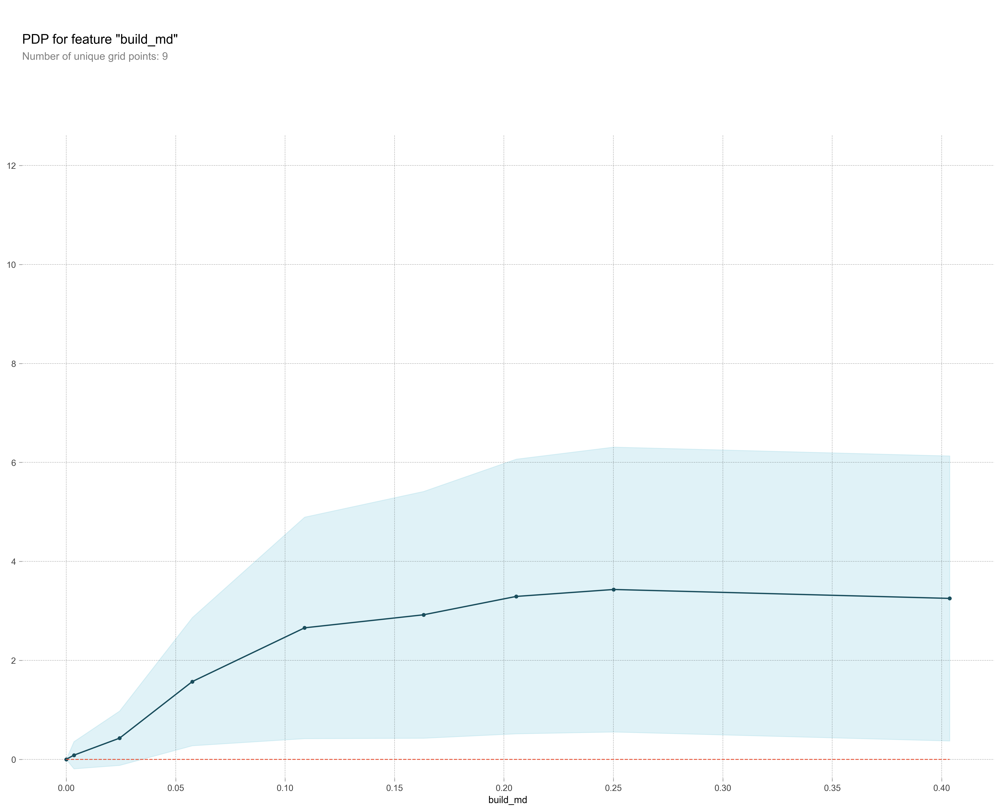

In [38]:
#@title Select a predictor to analyse Linear Regression Model. { run: "auto" }

selected_predictor = "build_md" #@param ['Age_08_04', 'KM', 'HP', 'Met_Color', 'Automatic', 'cc', 'Doors', 'Weight']
print('You selected', selected_predictor)
plot_pdp(model, X_train, selected_predictor)

In [39]:
from pdpbox import pdp
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag, figsize=(20,16))

You selected nl


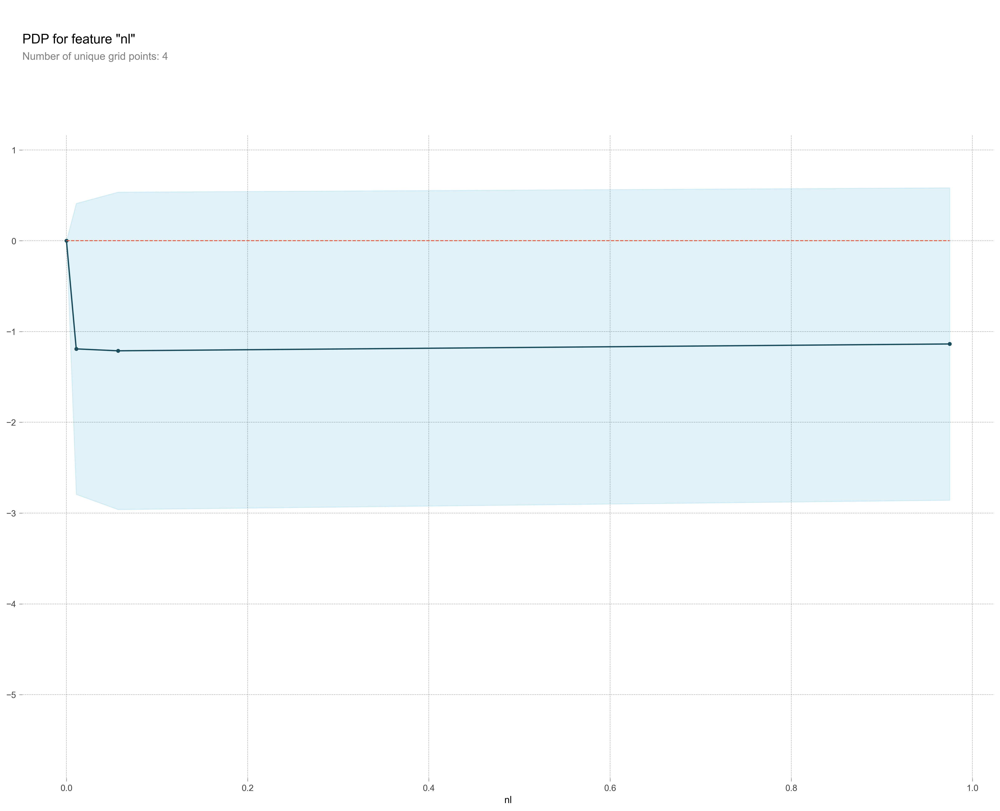

In [40]:
selected_predictor = 'nl'
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected sl


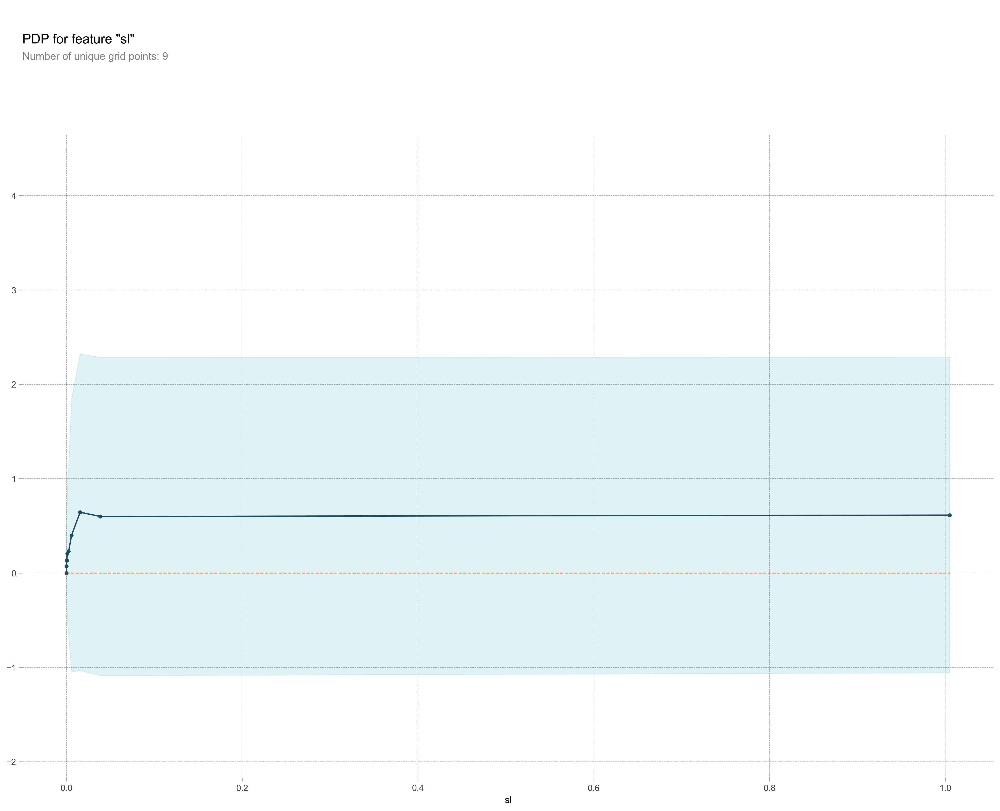

In [41]:
selected_predictor = "sl" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected sd


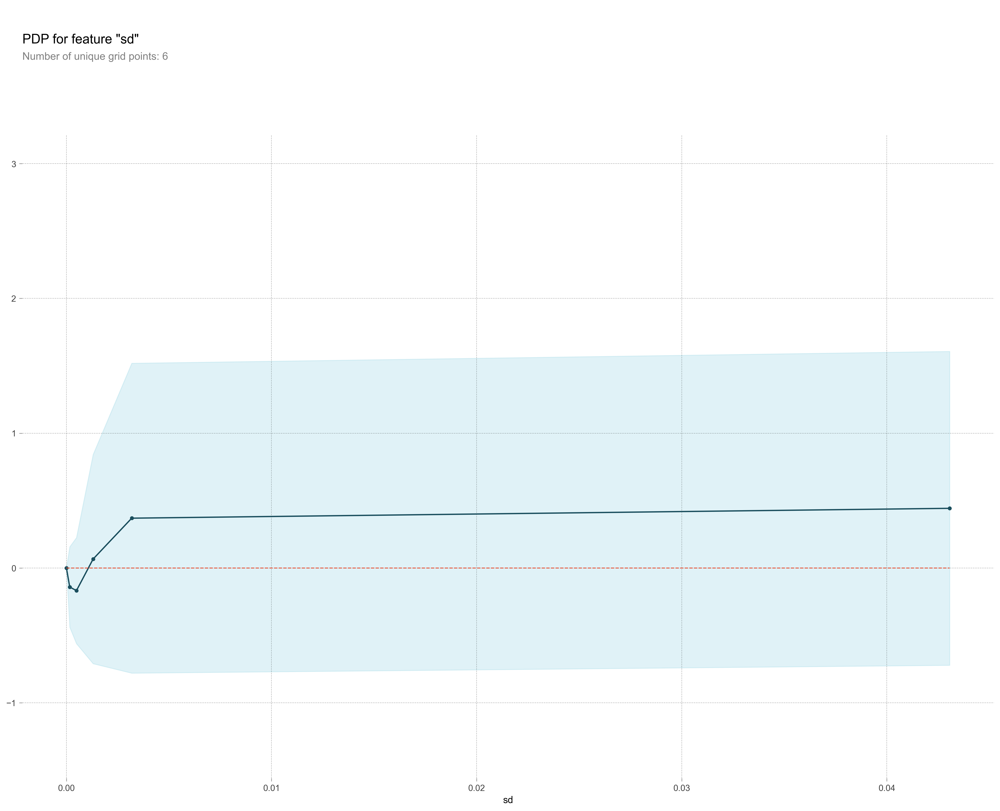

In [42]:
selected_predictor = "sd" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected gyldyd


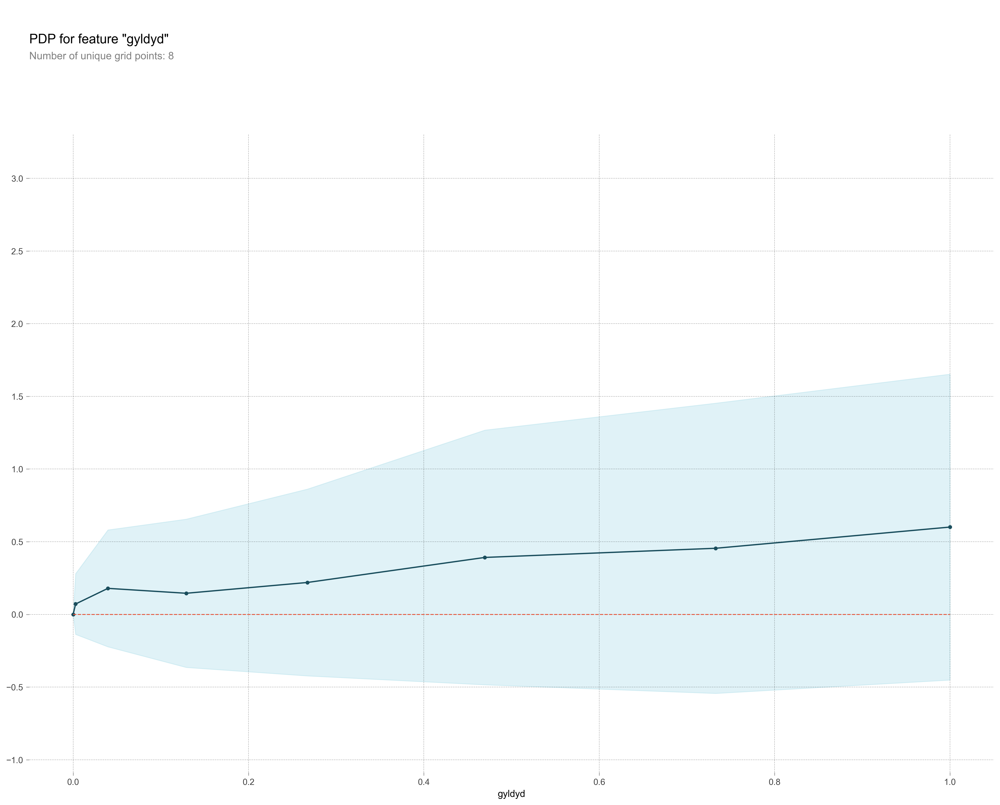

In [43]:
selected_predictor = "gyldyd" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected pop_midu


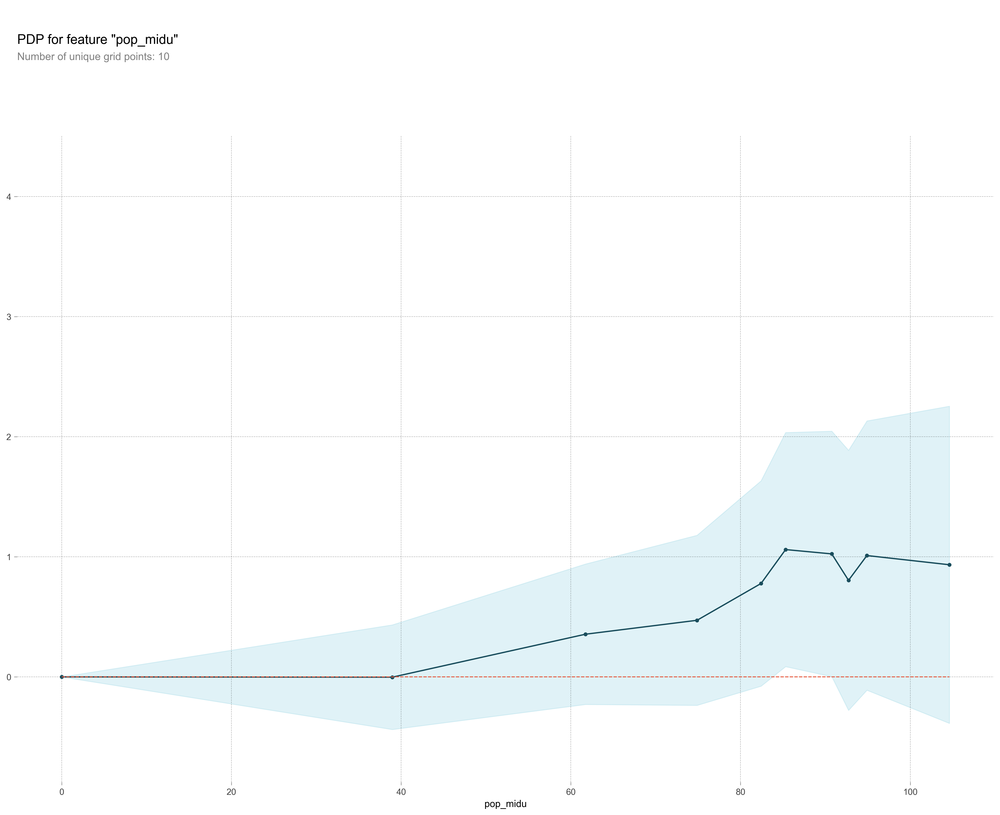

In [44]:
selected_predictor = "pop_midu" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected tccmd


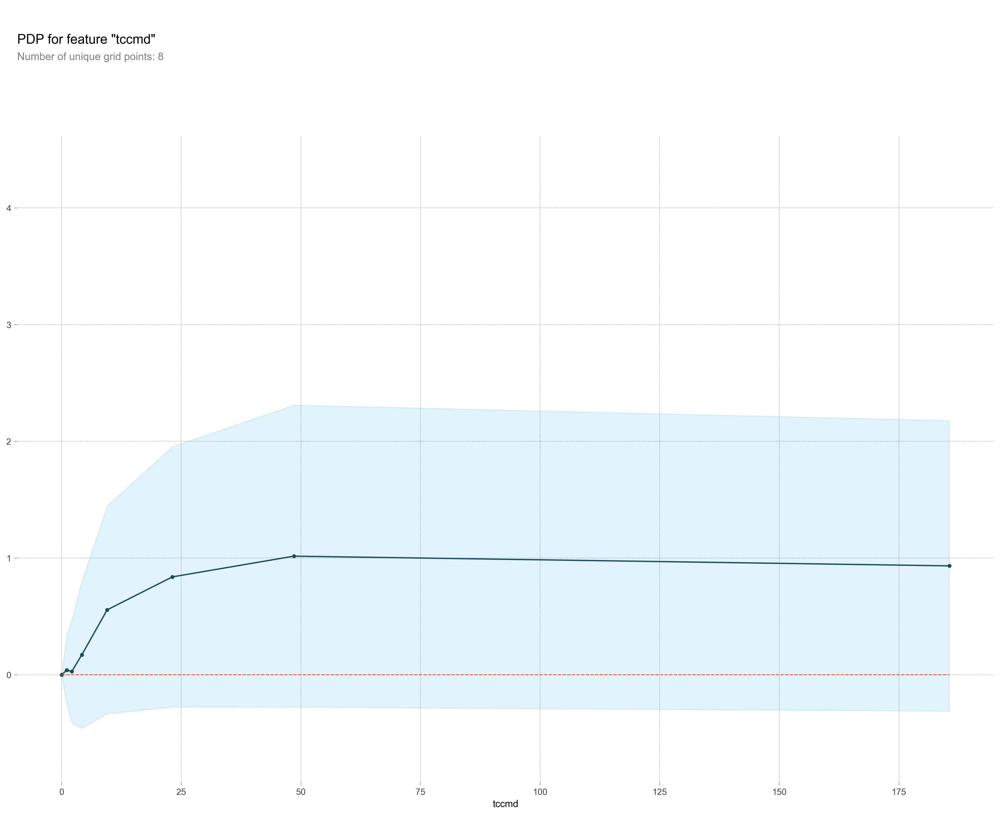

In [45]:
selected_predictor = "tccmd" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)